In [9]:
import numpy as np
import netCDF4 as nc
import matplotlib.pyplot as plt
import seaborn as sns
import os
import datetime
from sklearn import metrics
sns.set_theme()

In [2]:
def read_forcings(path,nz_=37):
    fp = open(path,'r')
    lines=fp.readlines()
    # determine number of timesteps first 
    t = 0
    for line in lines:
        if line[0]=='!':
            continue
        lsp = line.split(' ')
        if (lsp[1]==str(nz_) or (lsp[1]==(str(nz_)+'\n'))):
            t = t+1
    data={}
    headbool=True
    ti = -1
    alt = 0
    for line in lines:
        if line[0]=='!':
            continue
        if headbool:
            headbool = False
            lsp = line.split(' ')
            head_0 = [x for x in lsp if x != '']
            n = len(head_0)
            head=[]
            for x in head_0:
                if '\n' in x:
                    x = x[0:-1]
                head.append(x)
                data[x]=np.zeros((t,nz_))
            data['time']=[]
            continue
        lsp = line.split(' ')
        if (lsp[1]==str(nz_) or (lsp[1]==(str(nz_)+'\n'))):
            data['time'].append(float(lsp[0]))
            ti=ti+1
            alt=0
            continue
        for i in range(n):
            x = head[i]
            data[x][ti,alt]=float(lsp[i])
        alt=alt+1
    data['time']=np.array(data['time'])
    return data

In [3]:
clubb_dir = '/home/tsw35/tyche/clubb/'
#dirlist=['sgp_1c','sgp_nocpl','sgp_cpl_l2_now','sgp_cpl_l1_now','sgp_cpl_l40000_now','sgp_cpl_l2_w','sgp_cpl_l1_w','sgp_cpl_l40000_w']
dirlist=['sgp_1c','sgp_cpl_l2_now','sgp_cpl_l1_now','sgp_cpl_l2_w','sgp_cpl_l1_w']

In [60]:
day_list=['sgp_20150829', 'sgp_20180705', 'sgp_20170627', 'sgp_20180618', 'sgp_20180809', 'sgp_20170717', 'sgp_20170609']

In [71]:
def calc_blh(ri_,alt_):
    blh=np.zeros((ri_.shape[0],))
    for t in range(ri_.shape[0]):
        try:
            blh[t]=np.where(ri_[t,:]>.25)[0][0]
        except:
            pass

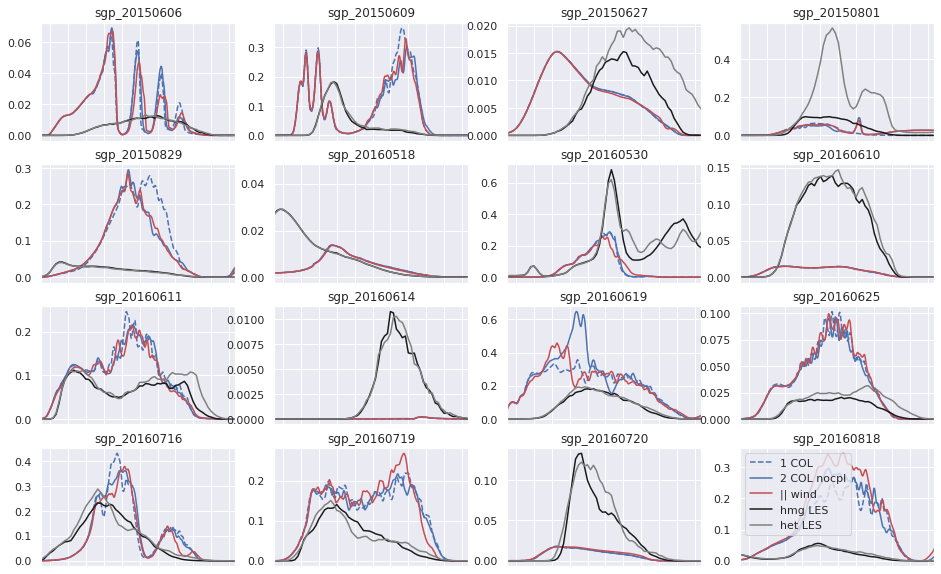

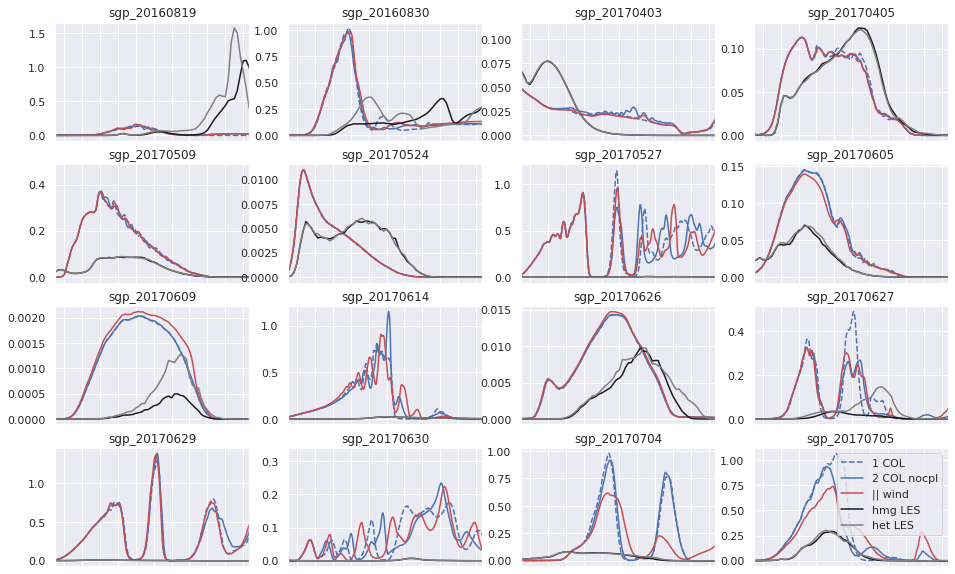

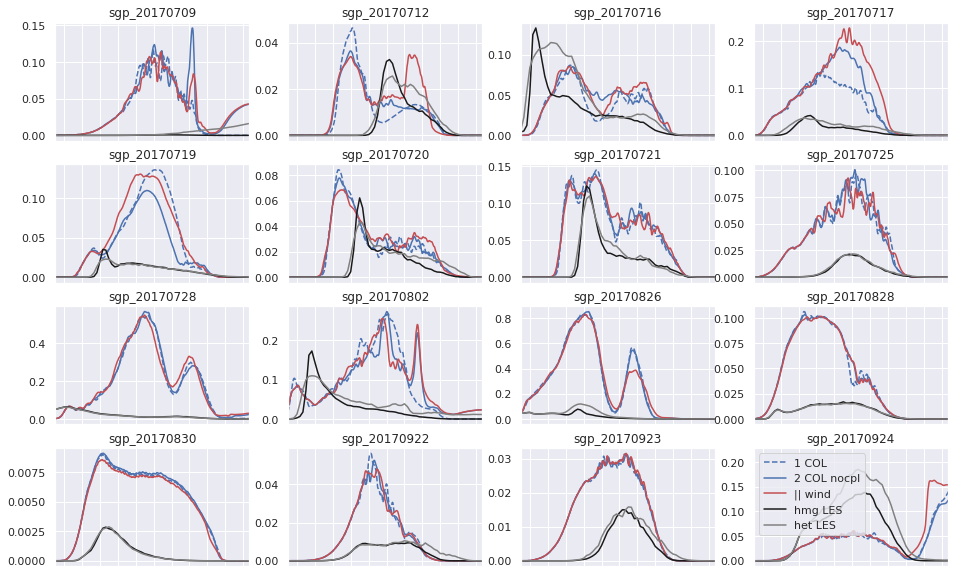

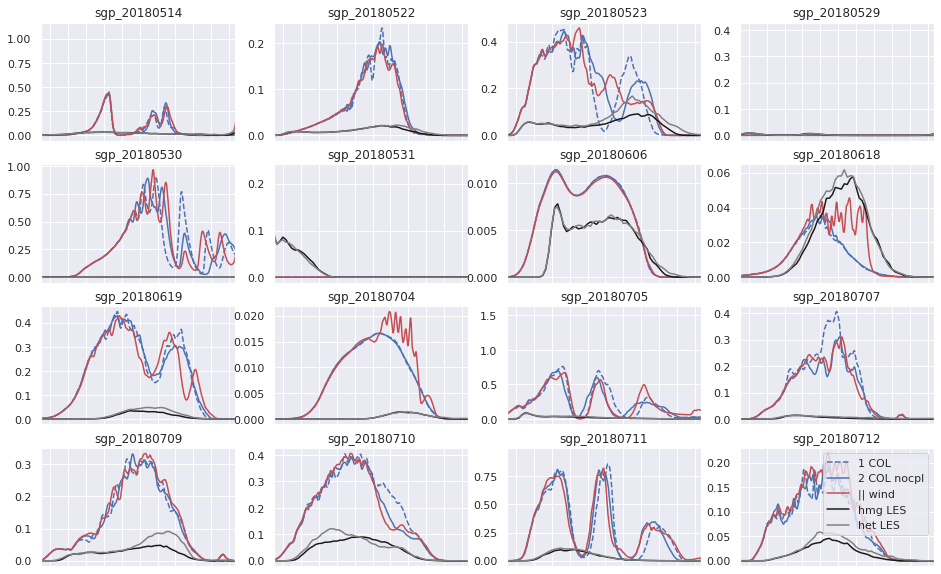

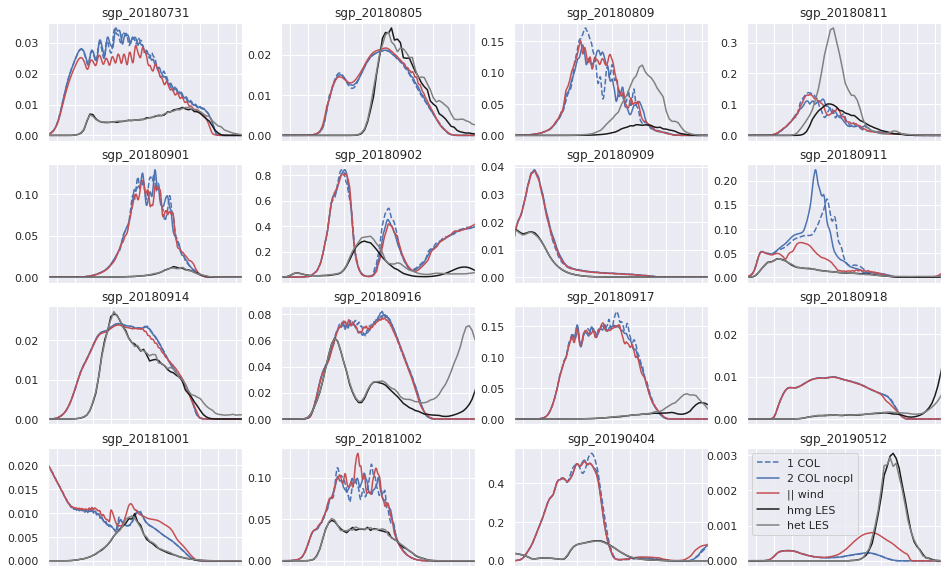

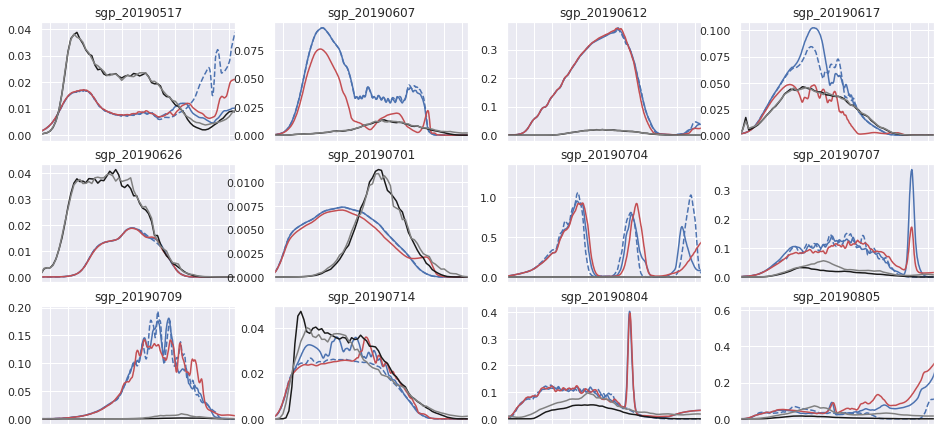

In [52]:
# COMPARE ALL LWP
frst = True
fdir = clubb_dir+'sgp_1c'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'
day_list2=os.listdir(fdir)
day_list2.sort()
plt.figure(figsize=(16,10))
i=1

fp=nc.Dataset(les_dir+'trimdoz_20170705_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_1c/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

for day in day_list2:
    if i==17:
        i=1
        plt.figure(figsize=(16,10))
    plt.subplot(4,4,i)
    i = i+1
    try:
        fp1c=nc.Dataset(clubb_dir+'sgp_1c_m/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
        fp2c=nc.Dataset(clubb_dir+'sgp_nocpl_m/'+day+'/k_2/agg_outsfc.nc','r')
        fpcl2w=nc.Dataset(clubb_dir+'sgp_cpl_m/'+day+'/k_2/agg_outsfc.nc','r')
    except Exception as e:
        print(day)
        print(e)
        print()
    
    try:
        plt.plot(times_clb1,fp1c['lwp'][:,0,0,0],'b--')
    except Exception as e:
        print(day)
        print(e)
        print()
    try:
        plt.plot(times_clb1,fp2c['lwp'][:,0,0,0],'b-')
    except Exception as e:
        print(day)
        print(e)
        print()
    try:
        plt.plot(times_clb1,fpcl2w['lwp'][:,0,0,0],'r-')
    except Exception as e:
        print(day)
        print(e)
        print()
    #try:
       # plt.plot(times_clb1,fpcl1n['lwp'][:,0,0,0],'g-')
    #except Exception as e:
     #   print(day)
      #  print(e)
       # print()
   # try:
        #plt.plot(times_clb1,fpcl1w['lwp'][:,0,0,0],'g--')
   # except Exception as e:
    #    print(day)
      #  print(e)
       # print()
    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticklabels([])
    
    plt.title(day)
    
    #homoLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
    plt.plot(times_js,fp['lwp'][:],'k-')
    fp.close()
    
    #hetLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')
    plt.plot(times_js,fp['lwp'][:],'-',color='grey')
    fp.close()
    
    leglist=dirlist.copy()
    leglist.append('HMG LES')
    leglist.append('HET LES')
    plt.xlim(times_js[15],times_js[80])
    if i == 17:
        plt.legend(['1 COL','2 COL nocpl','|| wind','hmg LES','het LES'])
        #plt.legend(['1 COL','|| no wind','|| wind','no wind','wind','hmg LES','het LES'])
   

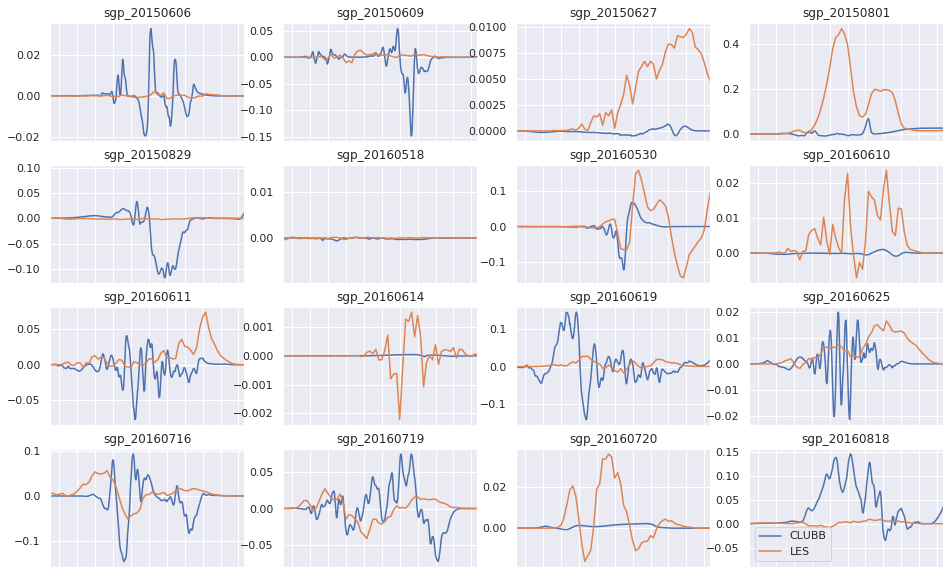

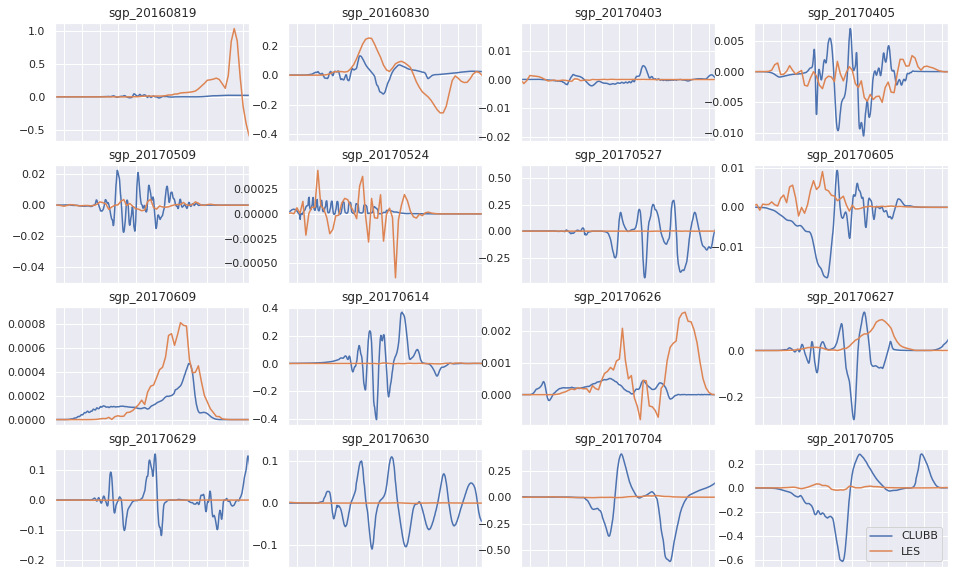

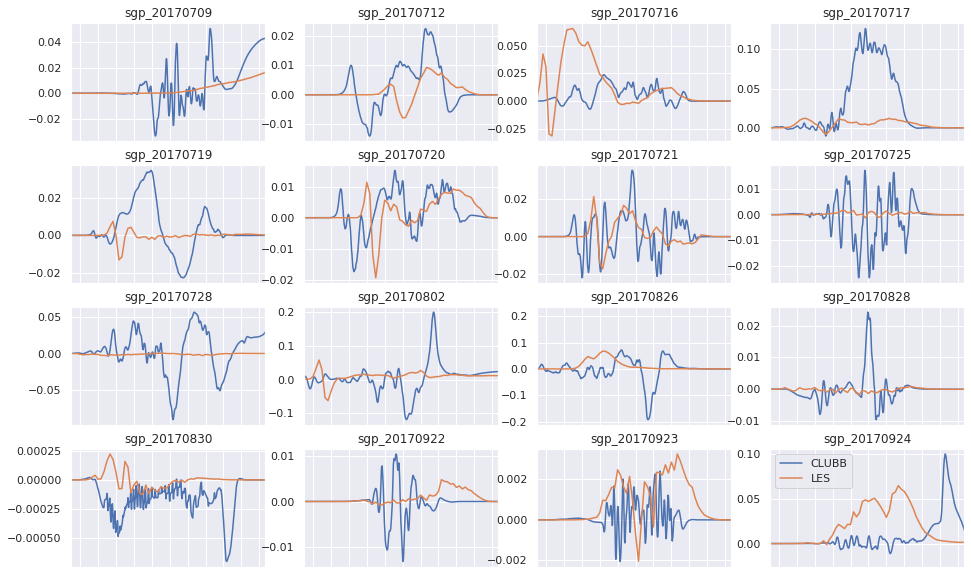

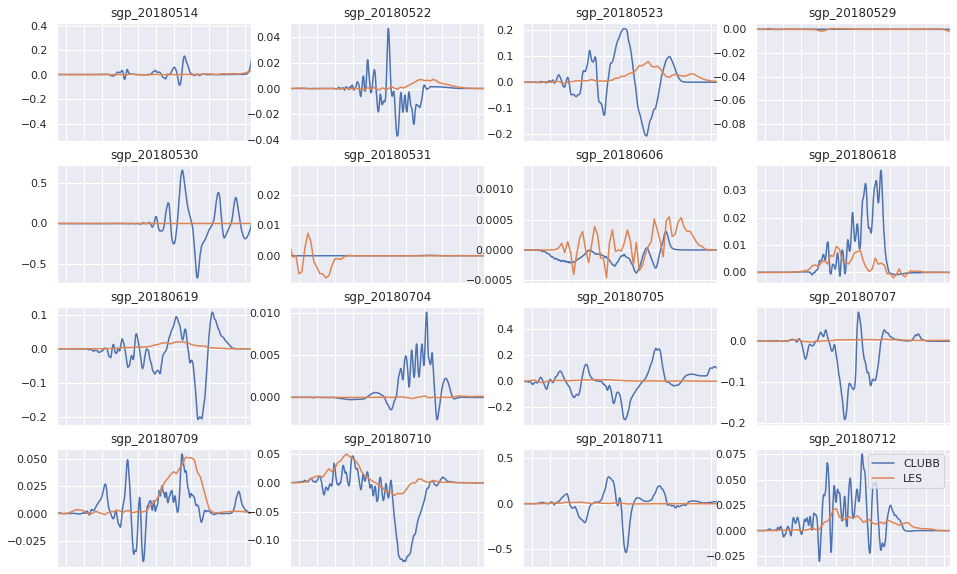

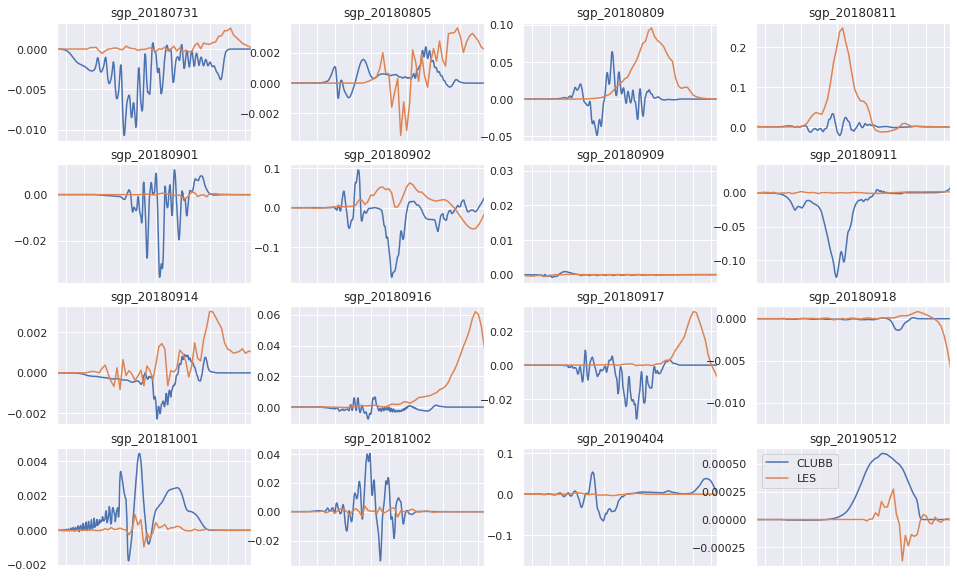

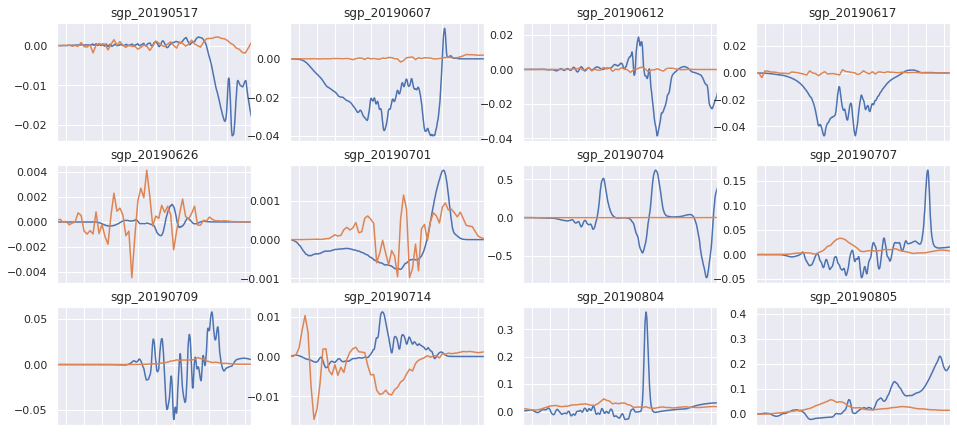

In [62]:
# COMPARE ALL LWP
frst = True
fdir = clubb_dir+'sgp_1c'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'
day_list2=os.listdir(fdir)
day_list2.sort()
plt.figure(figsize=(16,10))
i=1

fp=nc.Dataset(les_dir+'trimdoz_20170705_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_1c/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

for day in day_list2:
    if i==17:
        i=1
        plt.figure(figsize=(16,10))
    plt.subplot(4,4,i)
    i = i+1
    try:
        fp1c=nc.Dataset(clubb_dir+'sgp_1c_m/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
        fp2c=nc.Dataset(clubb_dir+'sgp_nocpl_m/'+day+'/k_2/agg_outsfc.nc','r')
        fpcl2w=nc.Dataset(clubb_dir+'sgp_cpl_m/'+day+'/k_2/agg_outsfc.nc','r')
    except Exception as e:
        print(day)
        print(e)
        print()
    
    plt.plot(times_clb1,fpcl2w['lwp'][:,0,0,0]-fp1c['lwp'][:,0,0,0])
    
    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticklabels([])
    
    plt.title(day)
    
    #homoLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
    lwp_hmg=fp['lwp'][:]
    fp.close()
    
    #hetLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')
    lwp_het=fp['lwp'][:]
    fp.close()
    
    plt.plot(times_js,lwp_het-lwp_hmg)
    
    plt.xlim(times_js[15],times_js[80])
    if i == 17:
        plt.legend(['CLUBB','LES'])
        #plt.legend(['1 COL','|| no wind','|| wind','no wind','wind','hmg LES','het LES'])
   

In [566]:
np.sqrt(2000)

44.721359549995796

sgp_20170527
x and y must have same first dimension, but have shapes (955,) and (590,)

sgp_20180514
x and y must have same first dimension, but have shapes (955,) and (815,)

sgp_20170614
x and y must have same first dimension, but have shapes (955,) and (750,)



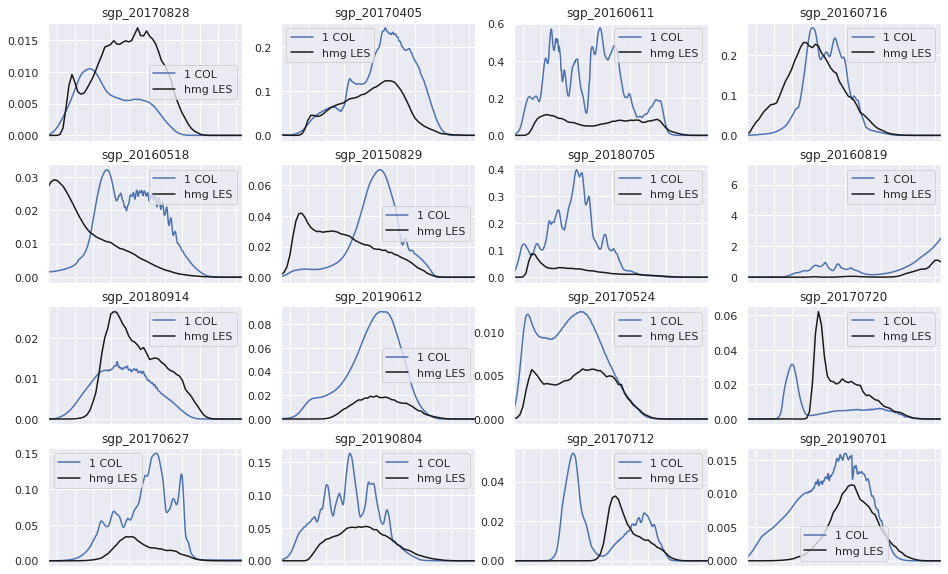

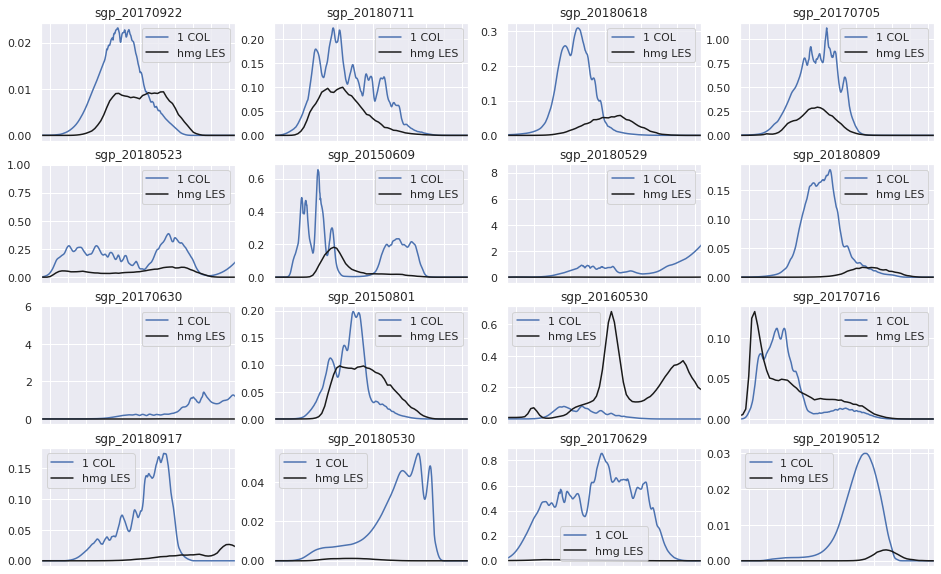

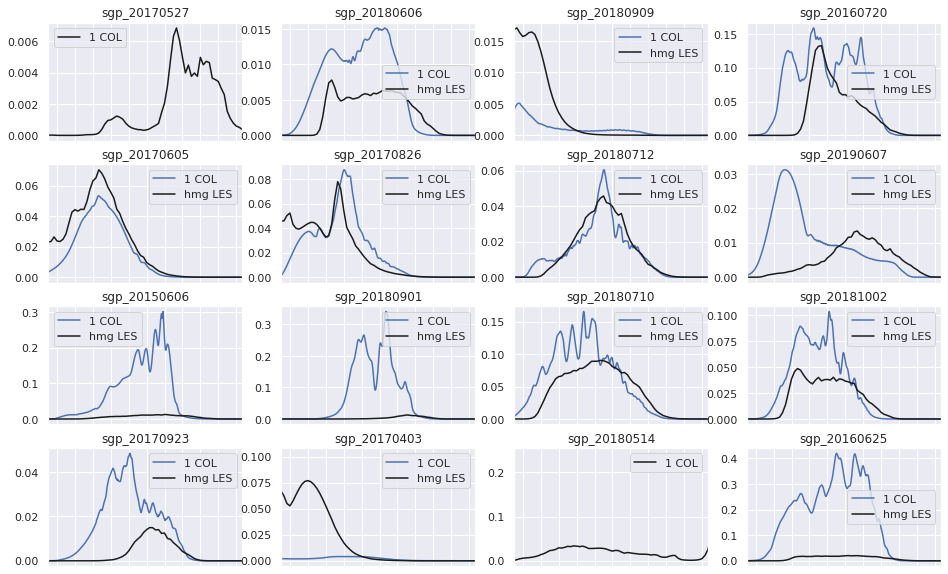

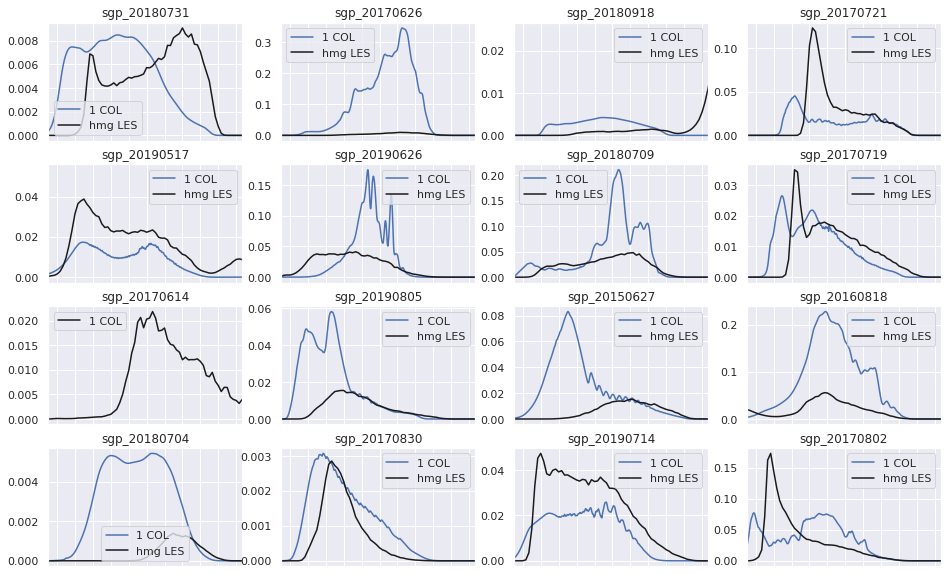

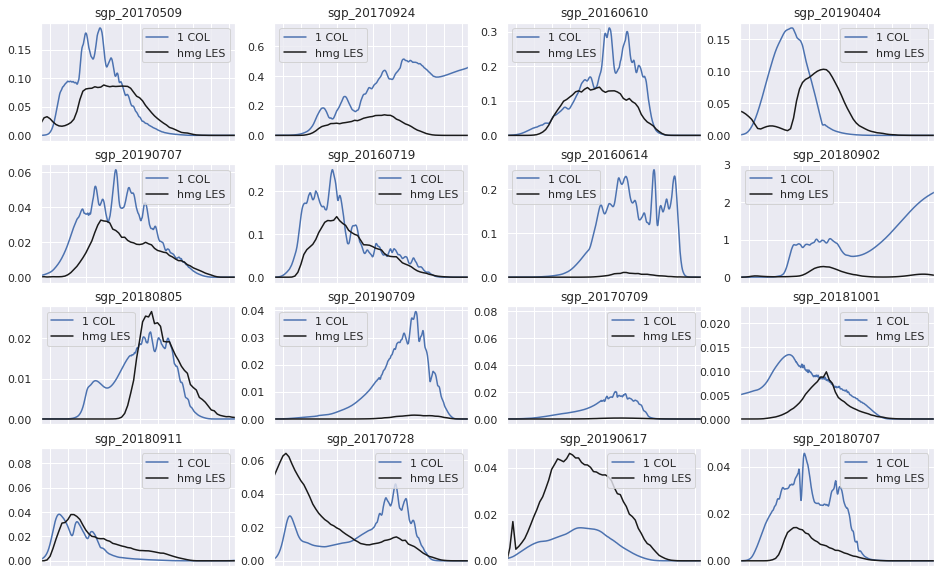

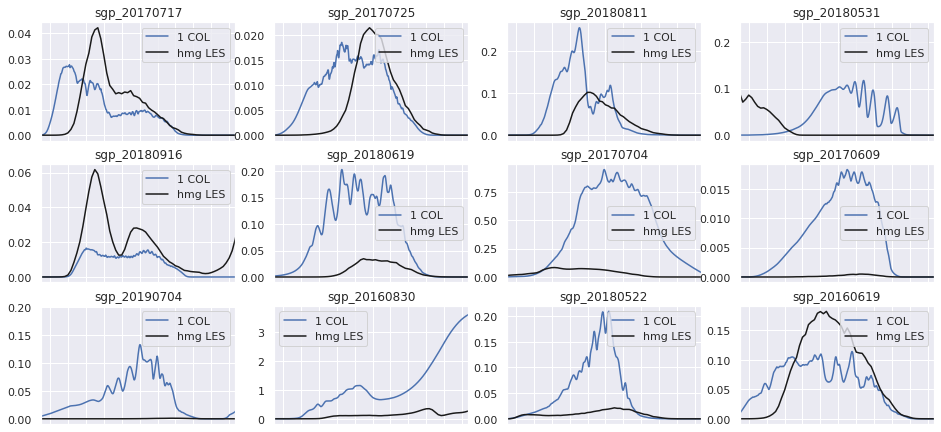

In [351]:
# COMPARE ALL LWP
frst = True
fdir = clubb_dir+'sgp_1c'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'
day_list2=os.listdir(fdir)
plt.figure(figsize=(16,10))
i=1

fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_1c/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

for day in day_list2:
    if i==17:
        i=1
        plt.figure(figsize=(16,10))
    plt.subplot(4,4,i)
    i = i+1
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fpcl2n=nc.Dataset(clubb_dir+'sgp_cpl_l2_now/'+day+'/k_2/agg_outsfc.nc','r')
    fpcl1n=nc.Dataset(clubb_dir+'sgp_cpl_l1_now/'+day+'/k_2/agg_outsfc.nc','r')
    fpcl2w=nc.Dataset(clubb_dir+'sgp_cpl_l2_w/'+day+'/k_2/agg_outsfc.nc','r')
    fpcl1w=nc.Dataset(clubb_dir+'sgp_cpl_l1_w/'+day+'/k_2/agg_outsfc.nc','r')
    
    try:
        plt.plot(times_clb1,fp1c['lwp'][:,0,0,0],'b-')
    except Exception as e:
        print(day)
        print(e)
        print()
    
    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticklabels([])
    
    plt.title(day)
    
    #homoLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
    plt.plot(times_js,fp['lwp'][:],'k-')
    fp.close()
   
    plt.xlim(times_js[15],times_js[80])
    plt.legend(['1 COL','hmg LES'])
    #plt.legend(['1 COL','|| no wind','|| wind','no wind','wind','hmg LES','het LES'])

In [105]:
def pblh(temp,alt1):
    temp_d=temp[:,1:]-temp[:,0:-1]
    pbl = np.zeros((temp.shape[0],))
    for i in range(len(pbl)):
        try:
            pbl[i]=alt1[:-1][temp_d[i,:]>-.1][0]
            if (pbl[i]>9000) or (pbl[i]<50):
                pbl[i]=float('NaN')
                
        except:
            pbl[i]=float('NaN')
    return pbl

x and y must have same first dimension, but have shapes (955,) and (850,)
sgp_20180705

x and y must have same first dimension, but have shapes (955,) and (590,)
sgp_20170527

x and y must have same first dimension, but have shapes (955,) and (815,)
sgp_20180514

x and y must have same first dimension, but have shapes (955,) and (750,)
sgp_20170614



<Figure size 432x288 with 0 Axes>

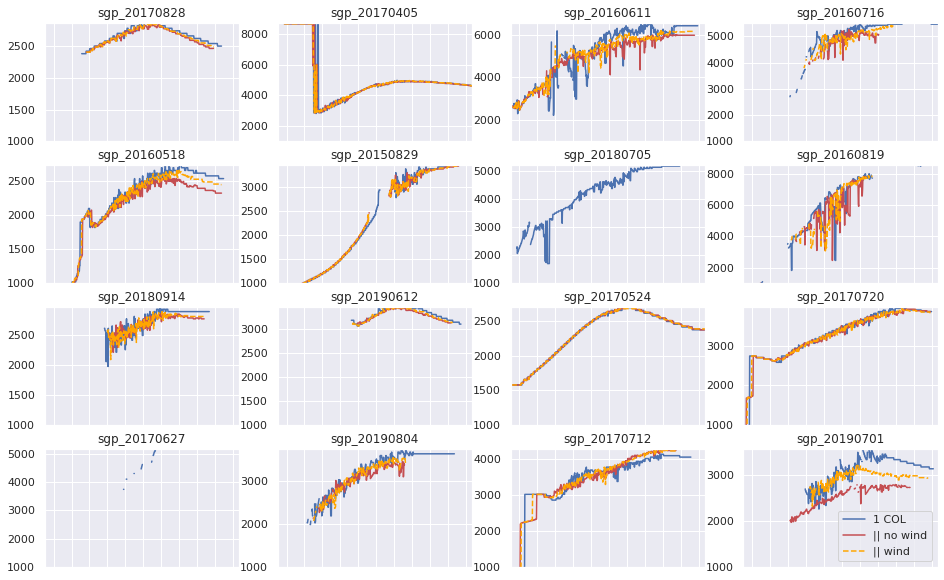

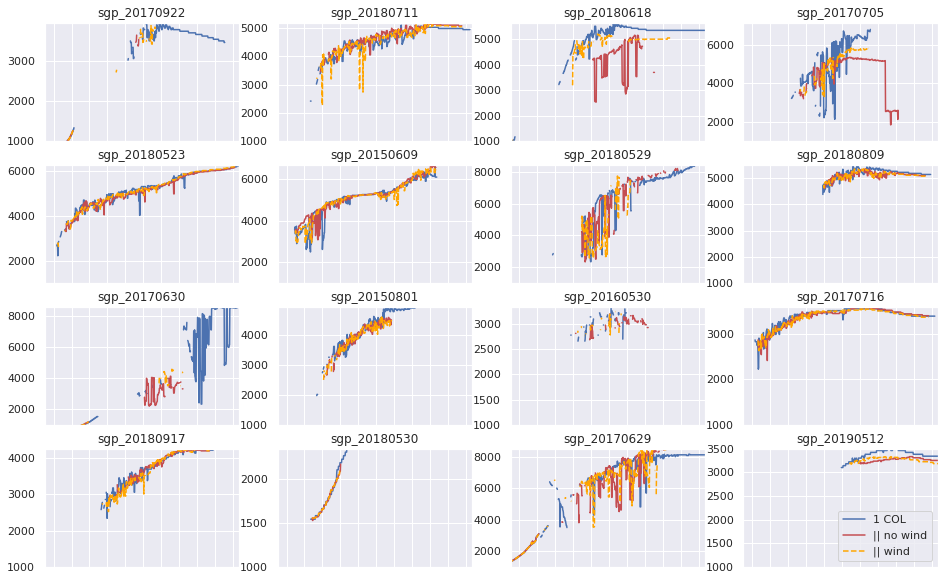

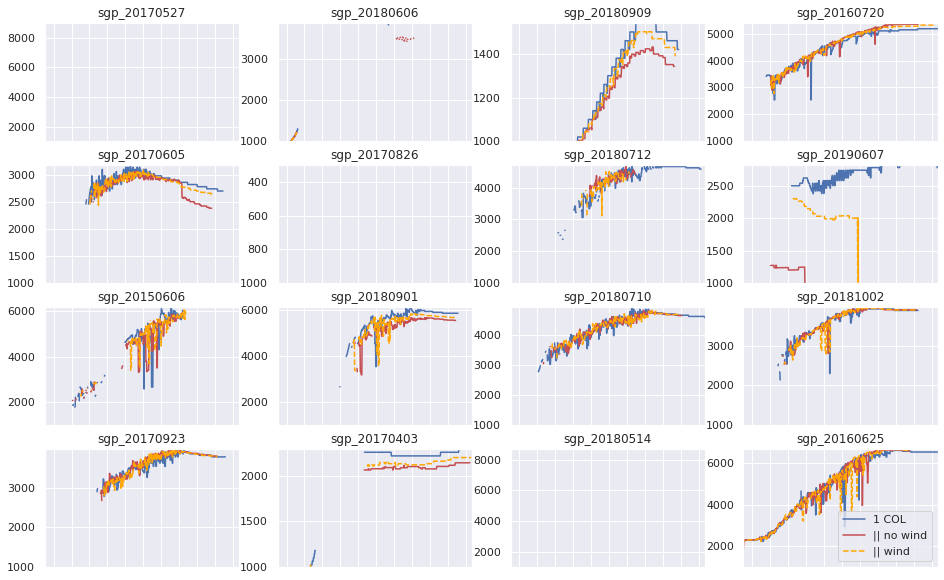

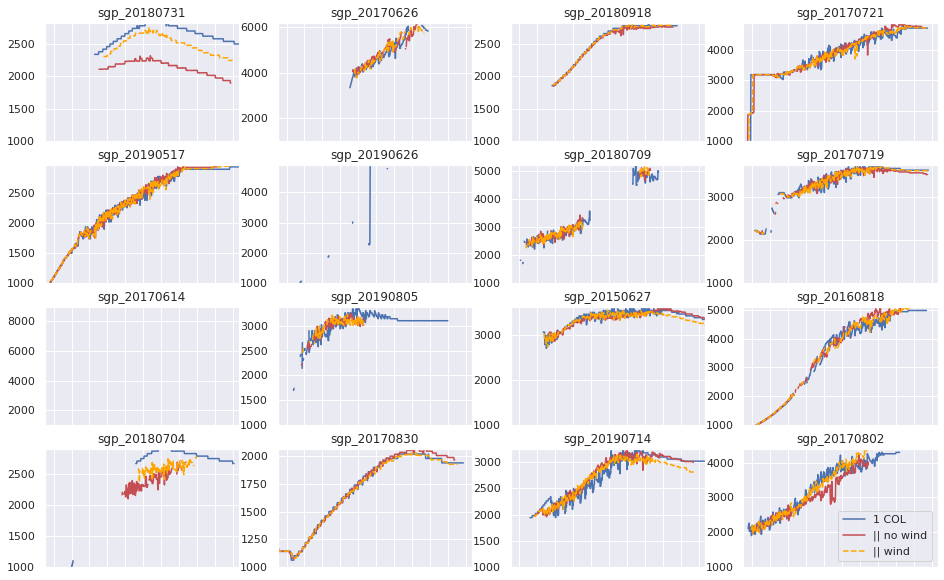

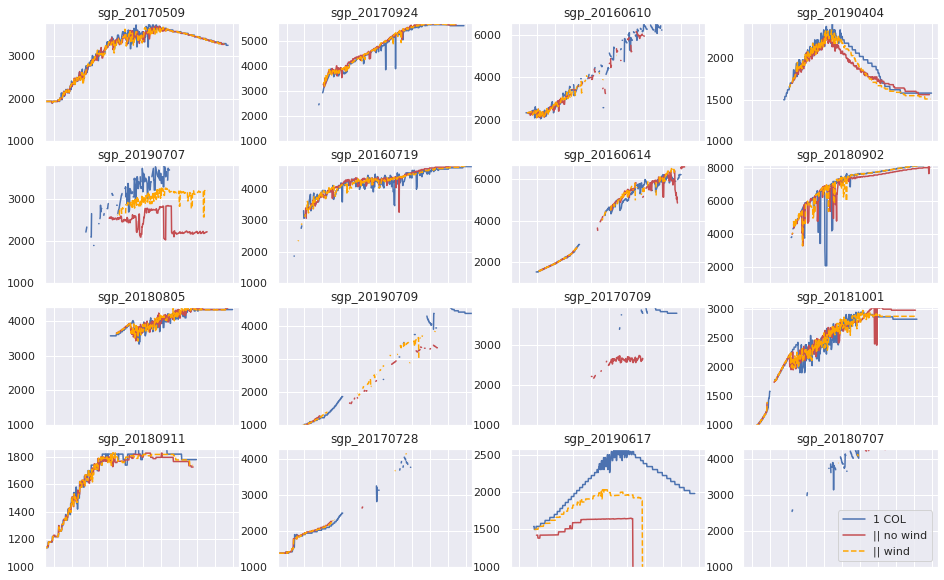

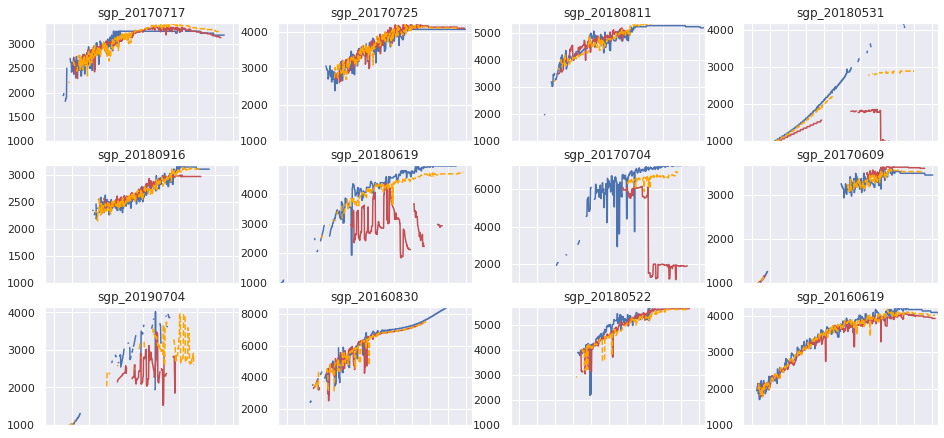

In [336]:
# COMPARE ALL PBLH
plt.figure()
frst = True
fdir = clubb_dir+'sgp_1c'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'
day_list2=os.listdir(fdir)
plt.figure(figsize=(16,10))
i=1

fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_nocpl/sgp_20180618/k_2/agg_outsfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

    

for day in day_list2:
    if i==17:
        i=1
        plt.figure(figsize=(16,10))
    plt.subplot(4,4,i)
    i = i+1
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_zt.nc','r')
    fpcl2n=nc.Dataset(clubb_dir+'sgp_cpl_l2_now/'+day+'/k_2/c_2/output/arm_zt.nc','r')
    fpcl2w=nc.Dataset(clubb_dir+'sgp_cpl_l2_w/'+day+'/k_2/c_2/output/arm_zt.nc','r')
    fpcl2n1=nc.Dataset(clubb_dir+'sgp_cpl_l2_now/'+day+'/k_2/c_1/output/arm_zt.nc','r')
    fpcl2w1=nc.Dataset(clubb_dir+'sgp_cpl_l2_w/'+day+'/k_2/c_1/output/arm_zt.nc','r')
    
    fpcl2nc=nc.Dataset(clubb_dir+'sgp_cpl_l2_now/'+day+'/k_2/clusters.nc','r')
    fpcl2wc=nc.Dataset(clubb_dir+'sgp_cpl_l2_w/'+day+'/k_2/clusters.nc','r')
    #fpcl1w=nc.Dataset(clubb_dir+'sgp_cpl_l1_w/'+day+'/k_2/c_2/output/arm_zt.nc','r')
    #fpcl1n=nc.Dataset(clubb_dir+'sgp_cpl_l1_now/'+day+'/k_2/c_2/output/arm_zt.nc','r')
    
    alt = fp1c['altitude'][:]
    try:
        pb1 = pblh(fp1c['T_in_K'][:,:,0,0],alt)
        pb2n = pblh(fpcl2n['T_in_K'][:,:,0,0],alt)*fpcl2nc['frac'][1]+pblh(fpcl2n1['T_in_K'][:,:,0,0],alt)*fpcl2nc['frac'][0]
        pb2w = pblh(fpcl2w['T_in_K'][:,:,0,0],alt)*fpcl2wc['frac'][1]+pblh(fpcl2w1['T_in_K'][:,:,0,0],alt)*fpcl2wc['frac'][0]
        plt.plot(times_clb1,pb1,'b-')
        plt.plot(times_clb1,pb2n,'r-')
        plt.plot(times_clb1,pb2w,'--',color='orange')
    except Exception as e:
        print(e)
        print(day)
        print()
    #plt.plot(times_clb1,pblh(fpcl1n['T_in_K'][:,:,0,0],alt),'g-')
    #plt.plot(times_clb1,pblh(fpcl1w['T_in_K'][:,:,0,0],alt),'g--')
    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticklabels([])
    
    plt.title(day)
    
    
    #homoLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
    z = fp['z'][30,:]
    #T = fp[:]
    #plt.plot(times_js,fp['lwp'][:],'k-')
    fp.close()
    
    #hetLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')
    #plt.plot(times_js,fp['lwp'][:],'-',color='grey')
    fp.close()
    
    leglist=dirlist.copy()
    leglist.append('HMG LES')
    leglist.append('HET LES')
    plt.xlim(times_js[15],times_js[80])
    plt.ylim(1000,max(np.nanmax(pb1),np.nanmax(pb2n),np.nanmax(pb2w)))
    if i == 17:
        plt.legend(['1 COL','|| no wind','|| wind','hmg LES','het LES'])

In [173]:
def TKE(fpc):
    tke_=.5*(fpc['wp2'][:,:,0,0]+fpc['up2'][:,:,0,0]+fpc['vp2'][:,:,0,0])
    tke_int = np.sum(tke_*40,axis=1)
    return tke_int

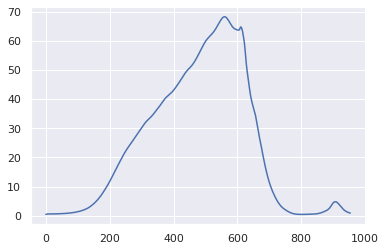

In [162]:
plt.plot(np.sum(fp1c['vp2'][:,:,0,0],axis=1))

In [153]:
type(a)

NoneType

<Figure size 432x288 with 0 Axes>

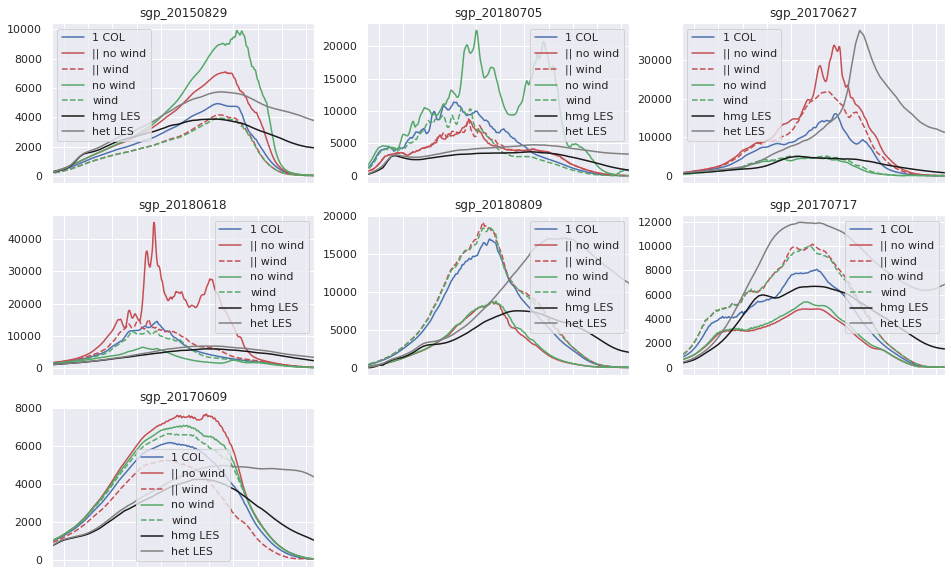

In [174]:
# COMPARE ALL TKE
plt.figure()
frst = True
fdir = clubb_dir+'sgp_1c'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'
#day_list=os.listdir(fdir)
plt.figure(figsize=(16,10))
i=1

fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_nocpl/sgp_20180618/k_2/agg_outsfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

    

for day in day_list:
    plt.subplot(3,3,i)
    i = i+1
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_zm.nc','r')
    fpcl2n=nc.Dataset(clubb_dir+'sgp_cpl_l2_now/'+day+'/k_2/c_2/output/arm_zm.nc','r')
    fpcl1n=nc.Dataset(clubb_dir+'sgp_cpl_l1_now/'+day+'/k_2/c_2/output/arm_zm.nc','r')
    fpcl2w=nc.Dataset(clubb_dir+'sgp_cpl_l2_w/'+day+'/k_2/c_2/output/arm_zm.nc','r')
    fpcl1w=nc.Dataset(clubb_dir+'sgp_cpl_l1_w/'+day+'/k_2/c_2/output/arm_zm.nc','r')
    
    
    plt.plot(times_clb1,TKE(fp1c),'b-')
    plt.plot(times_clb1,TKE(fpcl2n),'r-')
    plt.plot(times_clb1,TKE(fpcl2w),'r--')
    plt.plot(times_clb1,TKE(fpcl1n),'g-')
    plt.plot(times_clb1,TKE(fpcl1w),'g--')
    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticklabels([])
    
    plt.title(day)
    
    
    #homoLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
    plt.plot(times_js,fp['tke'][:],'k-')
    fp.close()
    
    #hetLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')
    plt.plot(times_js,fp['tke'][:],'-',color='grey')
    fp.close()
    
    leglist=dirlist.copy()
    leglist.append('HMG LES')
    leglist.append('HET LES')
    plt.legend(['1 COL','|| no wind','|| wind','no wind','wind','hmg LES','het LES'])
    plt.xlim(times_js[15],times_js[80])

In [211]:
def get_lhet(run_dir):
    fp_=open(run_dir+'/tw_run_param.txt','r')
    for line in fp_:
        if 'l_het' in line:
            return float(line.split(' ')[4])
    return 5

In [6]:
day_list=[]
for file in os.listdir(clubb_dir+'sgp_cpl_l1_now'):
    day_list.append(file)

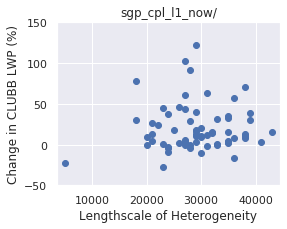

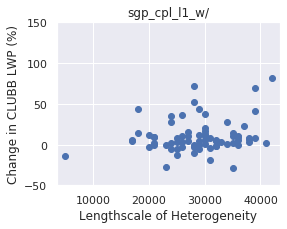

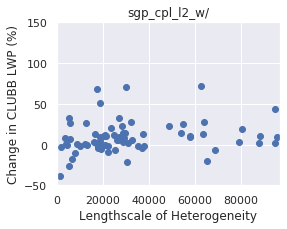

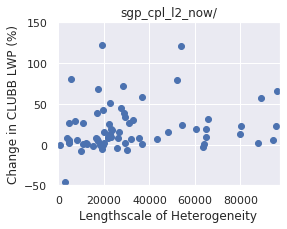

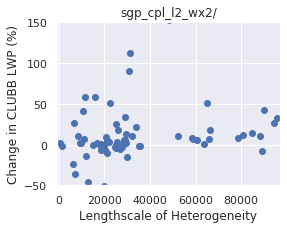

In [316]:
#### EXAMINE PERCENT CHANGE IN LWP vs Het lengthscale
for run in ['sgp_cpl_l1_now/','sgp_cpl_l1_w/','sgp_cpl_l2_w/','sgp_cpl_l2_now/','sgp_cpl_l2_wx2/']:
    #run='sgp_cpl_l2_now/'
    delta_run=[]
    lhets=[]
    for day in day_list:
        fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
        #fp1c=nc.Dataset(clubb_dir+'sgp_nocpl/'+day+'/k_2/agg_outsfc.nc','r')
        fp2c=nc.Dataset(clubb_dir+run+day+'/k_2/agg_outsfc.nc','r')
        delta_run.append((np.sum(fp2c['lwp'][:,0,0,0])-np.sum(fp1c['lwp'][:,0,0,0]))/(np.sum(fp1c['lwp'][:,0,0,0])))
        lhets.append(get_lhet(clubb_dir+run+day+'/'))
    plt.figure(figsize=(4,3))
    plt.title(run)
    plt.scatter(lhets,np.array(delta_run)*100)
    plt.xlim(np.min(np.abs(lhets))-1500,np.max(lhets)+1500)
    plt.ylim(-50,150)
    plt.xlabel('Lengthscale of Heterogeneity')
    plt.ylabel('Change in CLUBB LWP (%)')

sgp_cpl_m/
-0.409907790238605 49.90292715391865


NameError: name 'metrics' is not defined

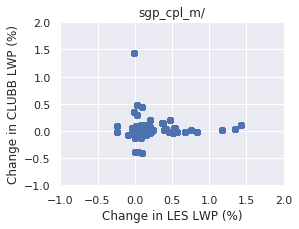

In [8]:
#### EXAMINE PERCENT CHANGE IN LWP
for run in ['sgp_cpl_m/']:
    #run='sgp_cpl_l2_now/'
    delta_run=[]
    delta_les=[]
    for day in day_list:
        fp1c=nc.Dataset(clubb_dir+'sgp_1c_m/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
        fp1c=nc.Dataset(clubb_dir+'sgp_nocpl_m/'+day+'/k_2/agg_outsfc.nc','r')
        fp2c=nc.Dataset(clubb_dir+run+day+'/k_2/agg_outsfc.nc','r')
        lwp_hmg=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')['lwp'][:]
        lwp_het=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')['lwp'][:]
        delta_run.append((np.sum(fp2c['lwp'][:,0,0,0])-np.sum(fp1c['lwp'][:,0,0,0]))/(np.sum(fp1c['lwp'][:,0,0,0])))
        delta_les.append((np.sum(lwp_het)-np.sum(lwp_hmg))/np.sum(lwp_hmg))
    plt.figure(figsize=(4,3))
    plt.title(run)
    plt.scatter(delta_les*100,delta_run*100)
    plt.xlabel('Change in LES LWP (%)')
    plt.ylabel('Change in CLUBB LWP (%)')
    minn=min(np.min(delta_run),np.min(delta_les))
    maxx=max(np.max(delta_run),np.max(delta_les))
    
    plt.xlim(-1,2)
    plt.ylim(-1,2)
    
    delta_run=np.array(delta_run)
    delta_les=np.array(delta_les)
    
    m=(delta_run<np.max(delta_les))
    
    print(run)
    print(str(minn)+' '+str(maxx))
    print(metrics.r2_score(delta_les[m],delta_run[m]))
    print()
    

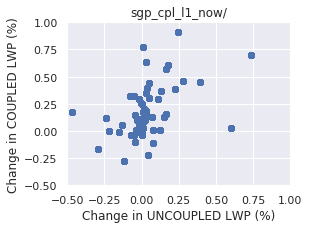

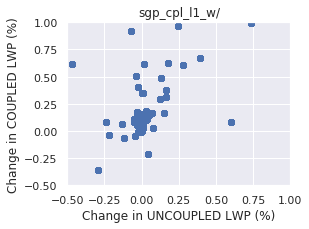

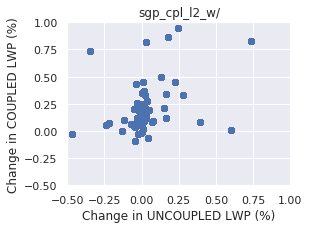

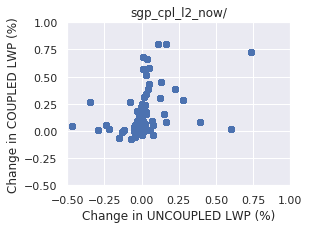

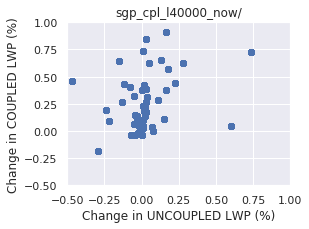

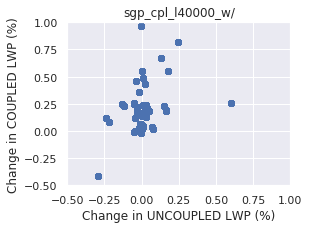

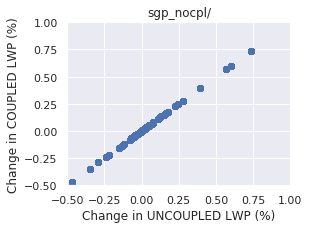

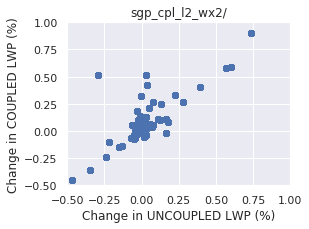

In [268]:
#### EXAMINE PERCENT CHANGE IN LWP
for run in ['sgp_cpl_l1_now/','sgp_cpl_l1_w/','sgp_cpl_l2_w/','sgp_cpl_l2_now/','sgp_cpl_l40000_now/','sgp_cpl_l40000_w/','sgp_nocpl/','sgp_cpl_l2_wx2/']:
    #run='sgp_cpl_l2_now/'
    delta_run=[]
    delta_nocpl=[]
    for day in day_list:
        fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
        fpc=nc.Dataset(clubb_dir+'sgp_nocpl/'+day+'/k_2/agg_outsfc.nc','r')
        fp2c=nc.Dataset(clubb_dir+run+day+'/k_2/agg_outsfc.nc','r')
        lwp_hmg=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')['lwp'][:]
        lwp_het=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')['lwp'][:]
        delta_run.append((np.sum(fp2c['lwp'][:,0,0,0])-np.sum(fp1c['lwp'][:,0,0,0]))/(np.sum(fp1c['lwp'][:,0,0,0])))
        delta_nocpl.append((np.sum(fpc['lwp'][:,0,0,0])-np.sum(fp1c['lwp'][:,0,0,0]))/(np.sum(fp1c['lwp'][:,0,0,0])))
    plt.figure(figsize=(4,3))
    plt.title(run)
    plt.scatter(delta_nocpl*100,delta_run*100)
    plt.xlabel('Change in UNCOUPLED LWP (%)')
    plt.ylabel('Change in COUPLED LWP (%)')
    minn=min(np.min(delta_run),np.min(delta_nocpl))
    maxx=max(np.max(delta_run),np.max(delta_nocpl))
    plt.xlim(-.5,1)
    plt.ylim(-.5,1)

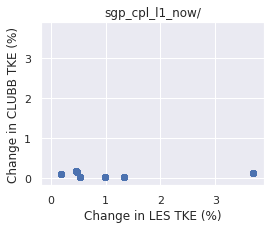

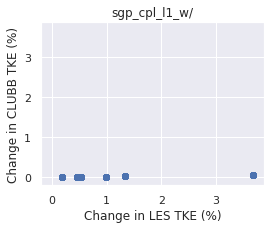

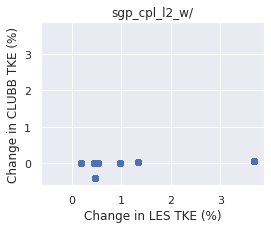

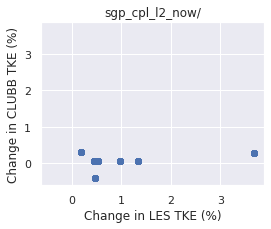

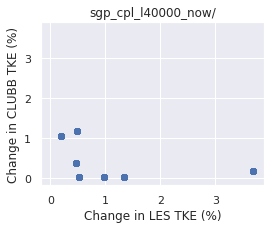

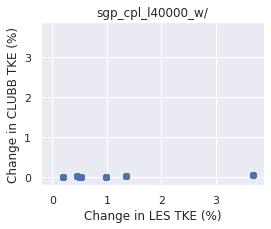

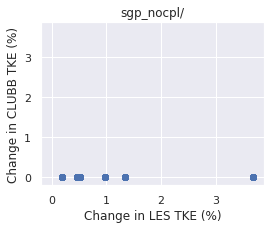

In [224]:
#### EXAMINE PERCENT CHANGE IN TKE
for run in ['sgp_cpl_l1_now/','sgp_cpl_l1_w/','sgp_cpl_l2_w/','sgp_cpl_l2_now/','sgp_cpl_l40000_now/','sgp_cpl_l40000_w/','sgp_nocpl/']:
    #run='sgp_cpl_l2_now/'
    delta_run=[]
    delta_les=[]
    for day in day_list:
        fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_zm.nc','r')
        #fp1c=nc.Dataset(clubb_dir+'sgp_nocpl/'+day+'/k_2/agg_outzm.nc','r')
        fp2c=nc.Dataset(clubb_dir+run+day+'/k_2/agg_outzm.nc','r')
        lwp_hmg=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')['tke'][:]
        lwp_het=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')['tke'][:]
        delta_run.append((np.sum(TKE(fp2c))-np.sum(TKE(fp1c)))/np.sum(TKE(fp1c)))
        delta_les.append((np.sum(lwp_het)-np.sum(lwp_hmg))/np.sum(lwp_hmg))
    plt.figure(figsize=(4,3))
    plt.title(run)
    plt.scatter(delta_les*100,delta_run*100)
    plt.xlabel('Change in LES TKE (%)')
    plt.ylabel('Change in CLUBB TKE (%)')
    minn=min(np.min(delta_run),np.min(delta_les))
    maxx=max(np.max(delta_run),np.max(delta_les))
    plt.xlim(minn-.2,maxx+.2)
    plt.ylim(minn-.2,maxx+.2)

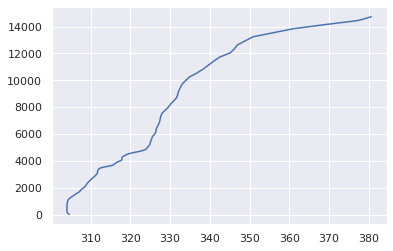

In [140]:
fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')
plt.plot(fp['thv'][30,:],fp['z'][30,:])

<Figure size 432x288 with 0 Axes>

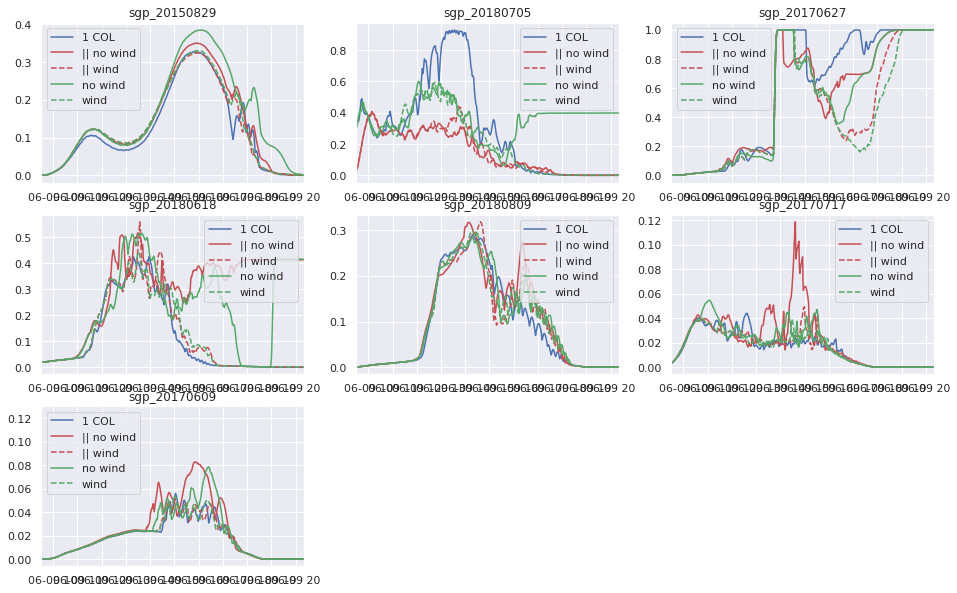

In [134]:
# COMPARE ALL LWP
plt.figure()
frst = True
fdir = clubb_dir+'sgp_1c'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'
#day_list=os.listdir(fdir)
plt.figure(figsize=(16,10))
i=1

fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_nocpl/sgp_20180618/k_2/agg_outsfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

for day in day_list:
    plt.subplot(3,3,i)
    i = i+1
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fpcl2n=nc.Dataset(clubb_dir+'sgp_cpl_l2_now/'+day+'/k_2/agg_outsfc.nc','r')
    fpcl1n=nc.Dataset(clubb_dir+'sgp_cpl_l1_now/'+day+'/k_2/agg_outsfc.nc','r')
    fpcl2w=nc.Dataset(clubb_dir+'sgp_cpl_l2_w/'+day+'/k_2/agg_outsfc.nc','r')
    fpcl1w=nc.Dataset(clubb_dir+'sgp_cpl_l1_w/'+day+'/k_2/agg_outsfc.nc','r')
    
    plt.plot(times_clb1,fp1c['cc'][:,0,0,0],'b-')
    plt.plot(times_clb1,fpcl2n['cc'][:,0,0,0],'r-')
    plt.plot(times_clb1,fpcl2w['cc'][:,0,0,0],'r--')
    plt.plot(times_clb1,fpcl1n['cc'][:,0,0,0],'g-')
    plt.plot(times_clb1,fpcl1w['cc'][:,0,0,0],'g--')
    
    
    plt.title(day)
    
    plt.legend(['1 COL','|| no wind','|| wind','no wind','wind'])
    plt.xlim(times_js[15],times_js[80])

<Figure size 432x288 with 0 Axes>

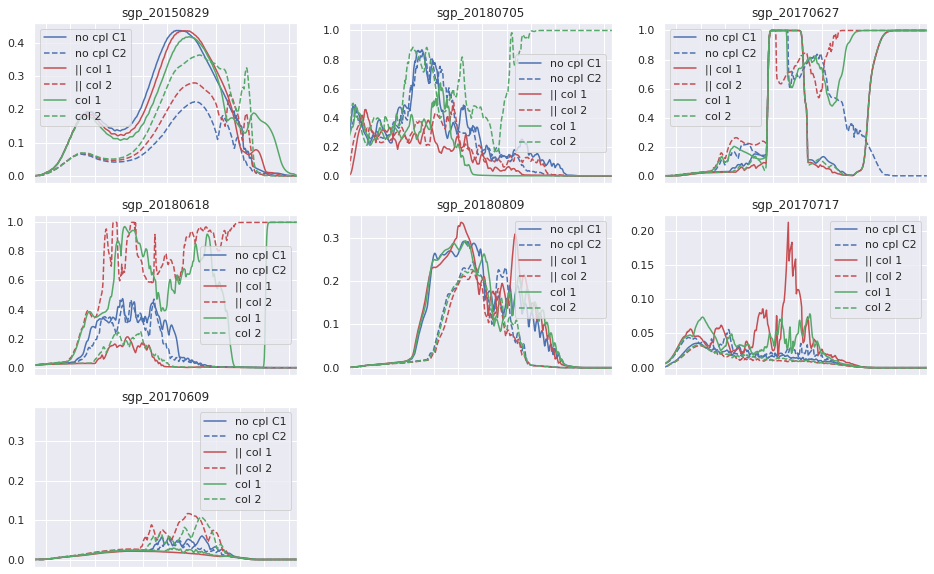

In [133]:
# COMPARE ALL LWP
plt.figure()
frst = True
fdir = clubb_dir+'sgp_1c'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'
#day_list=os.listdir(fdir)
plt.figure(figsize=(16,10))
i=1

fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_nocpl/sgp_20180618/k_2/agg_outsfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

for day in day_list:
    plt.subplot(3,3,i)
    i = i+1
    fp2c1=nc.Dataset(clubb_dir+'sgp_nocpl/'+day+'/k_2/c_1/output/arm_sfc.nc','r')
    fp2c2=nc.Dataset(clubb_dir+'sgp_nocpl/'+day+'/k_2/c_2/output/arm_sfc.nc','r')
    fpcl2n=nc.Dataset(clubb_dir+'sgp_cpl_l2_now/'+day+'/k_2/c_1/output/arm_sfc.nc','r')
    fpcl1n=nc.Dataset(clubb_dir+'sgp_cpl_l1_now/'+day+'/k_2/c_1/output/arm_sfc.nc','r')
    fpcl2n2=nc.Dataset(clubb_dir+'sgp_cpl_l2_now/'+day+'/k_2/c_2/output/arm_sfc.nc','r')
    fpcl1n2=nc.Dataset(clubb_dir+'sgp_cpl_l1_now/'+day+'/k_2/c_2/output/arm_sfc.nc','r')
    
    plotlist=[fp2c1,fp2c2,fpcl2n,fpcl2n2,fpcl1n,fpcl1n2]
    plotstyle=['b-','b--','r-','r--','g-','g--']
    for j in range(len(plotlist)):
        fp=plotlist[j]
        zc=fp['cc'][:,0,0,0]
        #zc[zc<100]=float('nan')
        plt.plot(times_clb1,zc,plotstyle[j])
        frame1 = plt.gca()
        frame1.axes.xaxis.set_ticklabels([])
    
    '''
    plt.plot(times_clb1,fp1c['z_cloud_base'][:,0,0,0],'b-')
    plt.plot(times_clb1,fpcl2n['z_cloud_base'][:,0,0,0],'r-')
    plt.plot(times_clb1,fpcl2n2['z_cloud_base'][:,0,0,0],'r--')
    plt.plot(times_clb1,fpcl1n['z_cloud_base'][:,0,0,0],'g-')
    plt.plot(times_clb1,fpcl1n2['z_cloud_base'][:,0,0,0],'g--')
    '''
    
    
    plt.title(day)
    
    plt.legend(['no cpl C1','no cpl C2','|| col 1','|| col 2','col 1','col 2'])
    plt.xlim(times_js[15],times_js[80])

In [232]:
fpcl4w.variables

OrderedDict([('W',
              <class 'netCDF4._netCDF4.Variable'>
              float64 W(clst, clst)
              unlimited dimensions: 
              current shape = (2, 2)
              filling on, default _FillValue of 9.969209968386869e+36 used),
             ('cluster',
              <class 'netCDF4._netCDF4.Variable'>
              float64 cluster(t, lon, lat)
              unlimited dimensions: 
              current shape = (17, 401, 401)
              filling on, default _FillValue of 9.969209968386869e+36 used),
             ('tskin',
              <class 'netCDF4._netCDF4.Variable'>
              float64 tskin(t, lon, lat)
              unlimited dimensions: 
              current shape = (17, 401, 401)
              filling on, default _FillValue of 9.969209968386869e+36 used),
             ('H',
              <class 'netCDF4._netCDF4.Variable'>
              float64 H(t, lon, lat)
              unlimited dimensions: 
              current shape = (17, 401, 401)
      

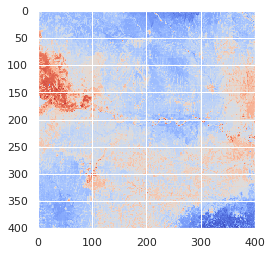

In [233]:
fpcl4w=nc.Dataset(clubb_dir+'sgp_cpl_l40000_w/sgp_20180705/k_2/clusters.nc','r')
plt.imshow(fpcl4w['H'][8,:,:],cmap='coolwarm')

u_r not found in /


<Figure size 432x288 with 0 Axes>

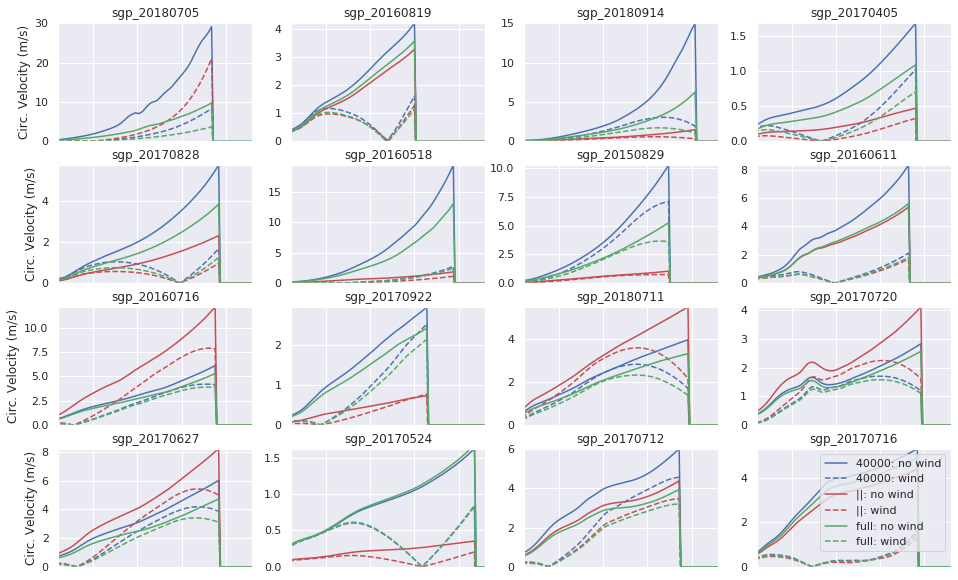

In [349]:
# COMPARE Circulations
plt.figure()
frst = True
fdir = clubb_dir+'sgp_1c'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'
#day_list=os.listdir(fdir)
plt.figure(figsize=(16,10))
i=1

fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_nocpl/sgp_20180618/k_2/agg_outsfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

for day in day_list:
    plt.subplot(4,4,i)
    i = i+1
    fpcl4w=nc.Dataset(clubb_dir+'sgp_cpl_l40000_w/'+day+'/k_2/clusters.nc','r')
    fpcl4n=nc.Dataset(clubb_dir+'sgp_cpl_l40000_now/'+day+'/k_2/clusters.nc','r')
    fpcl2n=nc.Dataset(clubb_dir+'sgp_cpl_l2_now/'+day+'/k_2/clusters.nc','r')
    fpcl1n=nc.Dataset(clubb_dir+'sgp_cpl_l1_now/'+day+'/k_2/clusters.nc','r')
    fpcl2w=nc.Dataset(clubb_dir+'sgp_cpl_l2_w/'+day+'/k_2/clusters.nc','r')
    fpcl1w=nc.Dataset(clubb_dir+'sgp_cpl_l1_w/'+day+'/k_2/clusters.nc','r')
    
    plt.plot(fpcl4n['u_r'][:],'b-')
    plt.plot(fpcl4w['u_r'][:],'b--')
    try:
        plt.plot(fpcl2n['u_r'][:],'r-')
    except:
        pass
    plt.plot(fpcl2w['u_r'][:],'r--')
    plt.plot(fpcl1n['u_r'][:],'g-')
    plt.plot(fpcl1w['u_r'][:],'g--')
    if i in [2,6,10,14]:
        plt.ylabel('Circ. Velocity (m/s)')
    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticklabels([])
    plt.xlim(30,140)
    try:
        plt.ylim(0,max(np.max(fpcl4n['u_r'][:]),np.max(fpcl2n['u_r'][:])))
    except Exception as e:
        print(e)
        plt.ylim(0,30)
    plt.title(day)
    if i==17:
        plt.legend(['40000: no wind','40000: wind','||: no wind','||: wind','full: no wind','full: wind'])
        break

In [343]:
print(fpcl4n)

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    dimensions(sizes): t(17), lat(401), lon(401), clst(2), t_model(192)
    variables(dimensions): float64 W(clst,clst), float64 cluster(t,lon,lat), float64 tskin(t,lon,lat), float64 H(t,lon,lat), float64 LE(t,lon,lat), float64 frac(clst), float64 H_clst(t,clst), float64 t_model(t_model), float64 u_r(t_model), float64 z_circ(t_model)
    groups: 



[-1.17263705  0.72472955]


(-3, 3)

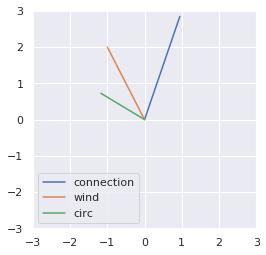

In [309]:
### FLOW DIR CHECK ####
plt.figure(figsize=(4,4))
def pv(v):
    plt.plot([0,v[0]],[0,v[1]])
def comp_(circ_dir,w_,ur):
    flow=circ_dir/np.sqrt(circ_dir[0]**2+circ_dir[1]**2)*ur

    adj_flow = flow-np.dot(np.dot(flow,w_)/np.dot(w_,w_),w_)
    ur=np.sqrt(adj_flow[0]**2+adj_flow[1]**2)
    return adj_flow
    
a=[2,6]
b=[-1,2]
u=3
aa=a/np.sqrt(a[0]**2+a[1]**2)*u
pv(aa)
pv(b)
af=comp_(a,b,u)
pv(af)
#plt.plot([aa[0],af[0]],[aa[1],af[1]])
print(af)
plt.legend(['connection','wind','circ'])
plt.xlim(-3,3)
plt.ylim(-3,3)

In [314]:
try:
    alds=ad/jk
except Exception as e:
    print(e)

name 'ad' is not defined


In [299]:
print(aa)

18.973665961010276


<Figure size 432x288 with 0 Axes>

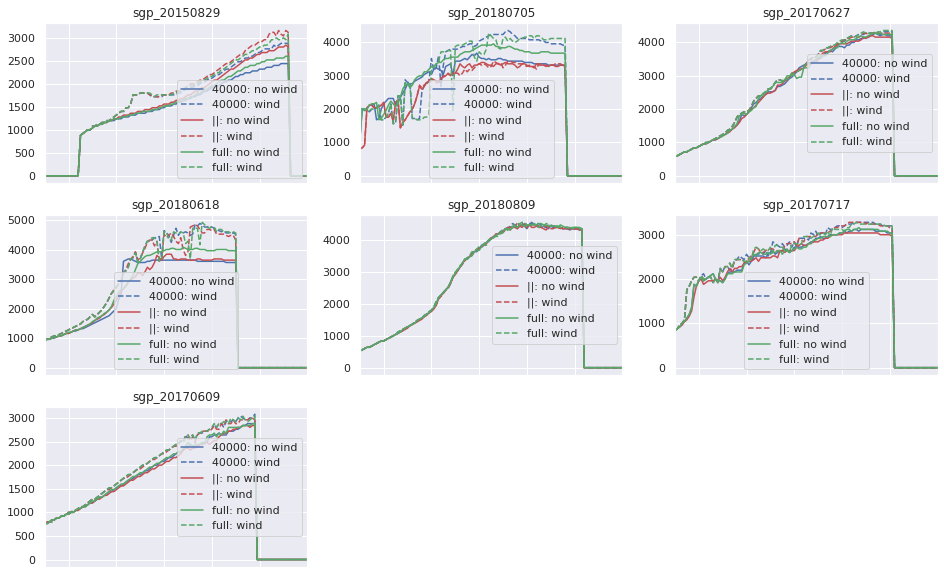

In [132]:
# COMPARE Circulations
plt.figure()
frst = True
fdir = clubb_dir+'sgp_1c'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'
#day_list=os.listdir(fdir)
plt.figure(figsize=(16,10))
i=1

fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_nocpl/sgp_20180618/k_2/agg_outsfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

for day in day_list:
    plt.subplot(3,3,i)
    i = i+1
    fpcl4w=nc.Dataset(clubb_dir+'sgp_cpl_l40000_w/'+day+'/k_2/clusters.nc','r')
    fpcl4n=nc.Dataset(clubb_dir+'sgp_cpl_l40000_now/'+day+'/k_2/clusters.nc','r')
    fpcl2n=nc.Dataset(clubb_dir+'sgp_cpl_l2_now/'+day+'/k_2/clusters.nc','r')
    fpcl1n=nc.Dataset(clubb_dir+'sgp_cpl_l1_now/'+day+'/k_2/clusters.nc','r')
    fpcl2w=nc.Dataset(clubb_dir+'sgp_cpl_l2_w/'+day+'/k_2/clusters.nc','r')
    fpcl1w=nc.Dataset(clubb_dir+'sgp_cpl_l1_w/'+day+'/k_2/clusters.nc','r')
    
    plt.plot(fpcl4n['z_circ'][:],'b-')
    plt.plot(fpcl4w['z_circ'][:],'b--')
    plt.plot(fpcl2n['z_circ'][:],'r-')
    plt.plot(fpcl2w['z_circ'][:],'r--')
    plt.plot(fpcl1n['z_circ'][:],'g-')
    plt.plot(fpcl1w['z_circ'][:],'g--')
    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticklabels([])
    
    plt.title(day)

    plt.legend(['40000: no wind','40000: wind','||: no wind','||: wind','full: no wind','full: wind'])
    plt.xlim(30,140)

In [98]:
temp=fpcl2n['T_in_K'][500,:,0,0]
#plt.plot(fpcl2n['T_in_K'][500,:,0,0],fpcl1n['altitude'][:])
temp_d=temp[1:]-temp[0:-1]
#plt.plot(temp_d[:],fpcl1n['altitude'][:-1])
plt.plot(pblh(fpcl2n['T_in_K'][:,:]))

TypeError: pblh() missing 1 required positional argument: 'alt1'

In [28]:
fp=nc.Dataset(clubb_dir+run+'/'+day+'/k_2/agg_outsfc.nc','r')
len(fp['lwp'][:,0,0,0])
print(fp['time'][1])

120.0


In [29]:
fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')
print(len(fp['lwp'][:]))
print(fp['time'][1])
fp.close()

91
756730.0


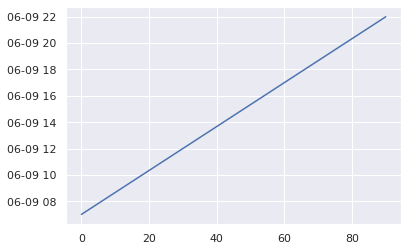

In [30]:
plt.plot(times_js)

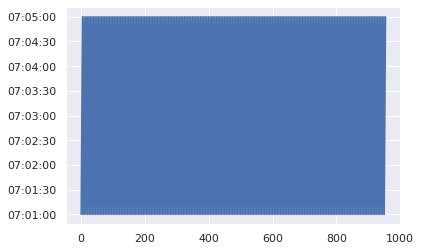

In [32]:
plt.plot(times_clb1)

In [352]:
#### CHECKING CPL7
test_dir='/home/tsw35/tyche/clubb/test_cpl7/'
fpzt = nc.Dataset(test_dir+'k_1/c_1/output/arm_zt.nc','r')
fpzm = nc.Dataset(test_dir+'k_1/c_1/output/arm_zm.nc','r')
fpsfc = nc.Dataset(test_dir+'k_1/c_1/output/arm_sfc.nc','r')

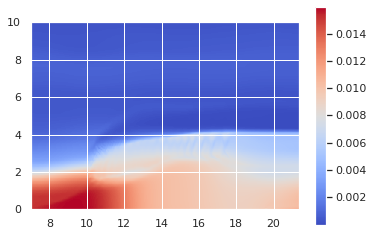

In [359]:
plt.imshow(fpzt['rtm'][:,:,0,0].T,origin='lower',cmap='coolwarm',extent=[7,860/60+7,0,10])
plt.colorbar()

In [67]:
times_js[0]

datetime.datetime(2017, 7, 5, 7, 0)

In [ ]:
# COMPARE ALL LWP
frst = True
fdir = clubb_dir+'sgp_1c'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'
day_list2=os.listdir(fdir)
day=day_list2[0]
plt.figure(figsize=(16,10))
i=1

fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_1c/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

fp=nc.Dataset(clubb_dir+'sgp_1c_dt1/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb2 = []
for t in range(len(fp['time'][:])):
    times_clb2.append(dt1+datetime.timedelta(seconds=int(t)))
    
fp=nc.Dataset(clubb_dir+'sgp_1c_dt6/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb6 = []
for t in range(len(fp['time'][:])):
    times_clb6.append(dt1+datetime.timedelta(seconds=int(t*6)))
    
fp=nc.Dataset(clubb_dir+'sgp_1c_dt12/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb12 = []
for t in range(len(fp['time'][:])):
    times_clb12.append(dt1+datetime.timedelta(seconds=int(t*12)))
    
fp=nc.Dataset(clubb_dir+'sgp_1c_dt30/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb30 = []
for t in range(len(fp['time'][:])):
    times_clb30.append(dt1+datetime.timedelta(seconds=int(t*30)))

print(day_list2[0:10])
for day in day_list2:
    if i==17:
        i=1
        plt.figure(figsize=(16,10))
    plt.subplot(4,4,i)
    i = i+1
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp1cm=nc.Dataset(clubb_dir+'sgp_1c_mphy/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp1cc=nc.Dataset(clubb_dir+'sgp_1c_mC2/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp1cN=nc.Dataset(clubb_dir+'sgp_1c_m100/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp1cs=nc.Dataset(clubb_dir+'sgp_1c_dt1/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp1cs6=nc.Dataset(clubb_dir+'sgp_1c_dt6/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp1cs12=nc.Dataset(clubb_dir+'sgp_1c_dt12/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp1cs30=nc.Dataset(clubb_dir+'sgp_1c_dt30/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    
    
    try:
        plt.plot(times_clb1,fp1c['lwp'][:,0,0,0],'b--')
    except Exception as e:
        print(day)
        print(e)
        print()
    #try:
    #    plt.plot(times_clb1,fp1cm['lwp'][:,0,0,0],'r-')
    #except Exception as e:
    #    times_clb2=times_clb1[0:len(fp1cm['lwp'][:,0,0,0])]
    #    plt.plot(times_clb2,fp1cm['lwp'][:,0,0,0],'r-')
    #    print(day)
    #    print(e)
    #    print()
    #try:
    #    plt.plot(times_clb1,fp1cc['lwp'][:,0,0,0],'g-')
    #except Exception as e:
    #    print(day)
    #    print(e)
        print()
    try:
        plt.plot(times_clb2,fp1cs['lwp'][:,0,0,0],'-',color='dimgrey')
    except Exception as e:
        print(day)
        print(e)
        print()
    try:
        plt.plot(times_clb6,fp1cs6['lwp'][:,0,0,0],'-',color='darkgrey')
    except Exception as e:
        print(day)
        print(e)
        print()
    try:
        plt.plot(times_clb12,fp1cs12['lwp'][:,0,0,0],'-',color='silver')
    except Exception as e:
        print(day)
        print(e)
        print()
    try:
        plt.plot(times_clb30,fp1cs30['lwp'][:,0,0,0],'-',color='lightgrey')
    except Exception as e:
        print(day)
        print(e)
        print()


    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticklabels([])
    
    plt.title(day)
    
    #homoLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
    plt.plot(times_js,fp['lwp'][:],'-',color='indigo')
    fp.close()
    
    #hetLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')
    plt.plot(times_js,fp['lwp'][:],'-',color='violet')
    fp.close()
    
    leglist=dirlist.copy()
    leglist.append('HMG LES')
    leglist.append('HET LES')
    plt.xlim(times_js[15],times_js[80])
    if i == 17:
        plt.legend(['1 COL','1 COL dt1','1 COL dt6','1 COL dt12','1 COL dt30','hmg LES','het LES'])
        #plt.legend(['1 COL','|| no wind','|| wind','no wind','wind','hmg LES','het LES'])

['sgp_20170828', 'sgp_20170405', 'sgp_20160611', 'sgp_20160716', 'sgp_20160518', 'sgp_20150829', 'sgp_20180705', 'sgp_20160819', 'sgp_20180914', 'sgp_20190612']


In [428]:
print(times_clb30[0])
print(times_clb30[-1])

2016-06-19 07:00:00
2016-06-19 22:54:30


In [368]:
from scipy import stats

x and y must have the same length.
x and y must have the same length.
x and y must have the same length.


TypeError: unsupported operand type(s) for -: 'list' and 'list'

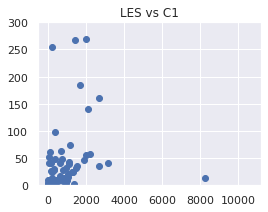

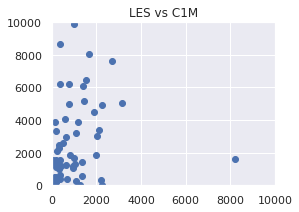

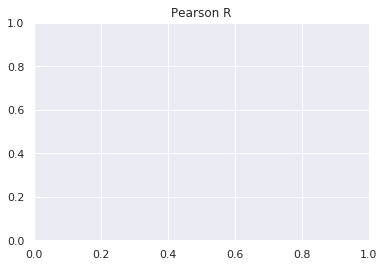

In [418]:
tot_hmg =[]
tot_c1  =[]
tot_c1m =[]
pr_c1   =[]
pr_c1m  =[]
t_js    =[]
t_clb2  =[]
t_clb1  =[]
day_list3=[]
for t in times_js:
    t_js.append((t-times_js[0]).seconds)
for t in times_clb2:
    t_clb2.append((t-times_clb2[0]).seconds)
for t in times_clb1:
    t_clb1.append((t-times_clb1[0]).seconds)

for day in day_list:
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp1cm=nc.Dataset(clubb_dir+'sgp_1c_dt1/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    lwp_hmg =nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')['lwp'][:]
    les_int = np.interp(t_clb2,t_js,lwp_hmg)
    les_int2= np.interp(t_clb1,t_js,lwp_hmg)
    tot_hmg.append(np.sum(les_int))
    tot_c1.append(np.sum(fp1c['lwp'][:,0,0,0]))
    tot_c1m.append(np.sum(fp1cm['lwp'][:,0,0,0]))
    try:
        pr_c1.append(stats.pearsonr(les_int2,fp1c['lwp'][:,0,0,0])[0])
    except Exception as e:
        print(e)
        continue
    pr_c1m.append(stats.pearsonr(les_int,fp1cm['lwp'][:,0,0,0])[0])
    day_list3.append(day)
    
plt.figure(figsize=(4,3))
plt.title('LES vs C1')
plt.scatter(tot_hmg,tot_c1)
plt.ylim(0,300)

plt.figure(figsize=(4,3))
plt.title('LES vs C1M')
plt.scatter(tot_hmg,tot_c1m)
plt.xlim(0,10000)
plt.ylim(0,10000)

plt.figure()
plt.title('Pearson R')
plt.plot(pr_c1-pr_c1m,'b-o')
#plt.plot(pr_c1m,'r-o')



In [414]:
pr_c1=np.array(pr_c1)
pr_c1m=np.array(pr_c1m)

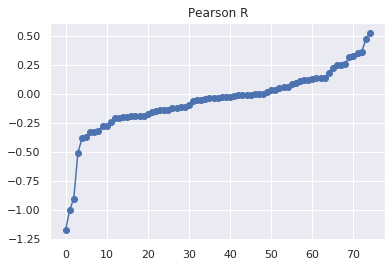

In [417]:
plt.figure()
plt.title('Pearson R')
diff_arr=pr_c1m-pr_c1
diff_arr.sort()
plt.plot(diff_arr,'b-o')

(array([ 2.,  4.,  3.,  2.,  3.,  3.,  1.,  6.,  5.,  6., 10., 13., 10.,
         7.]),
 array([-0.4, -0.3, -0.2, -0.1,  0. ,  0.1,  0.2,  0.3,  0.4,  0.5,  0.6,
         0.7,  0.8,  0.9,  1. ]),
 <a list of 14 Patch objects>)

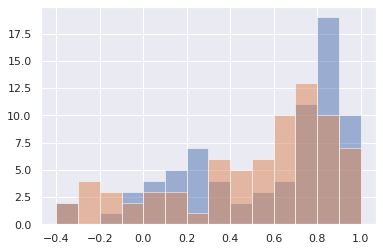

In [412]:
bins=[-.4,-.3,-.2,-.1,0,.1,.2,.3,.4,.5,.6,.7,.8,.9,1]
plt.hist(pr_c1,bins,alpha=.5)
plt.hist(pr_c1m,bins,alpha=.5)

In [401]:
print(np.mean(pr_c1))
print(np.mean(pr_c1m))

0.5666874769019975
0.42289856882713767


(array([ 4.,  4.,  4.,  4.,  9.,  5.,  9.,  8., 10., 18.]),
 array([-0.35866675, -0.22675786, -0.09484897,  0.03705992,  0.16896881,
         0.3008777 ,  0.43278659,  0.56469548,  0.69660436,  0.82851325,
         0.96042214]),
 <a list of 10 Patch objects>)

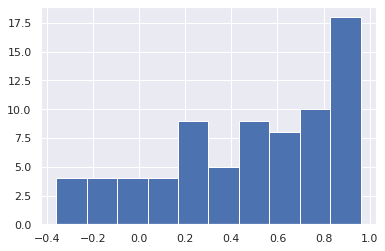

In [389]:
plt.hist(pr_c1m)

In [430]:
##################################################
####### PARAMETER TUNING PART ONE ################
##################################################

In [65]:
tune_list=[]
for file in os.listdir(clubb_dir):
    if 'tune' in file:
        tune_list.append(file)

In [537]:
##### PULL DATA #####
peak_val = {}
mean_val = {}
peak_tim = {}
pc10_tim = {}  #time to 10% of peak
gamma    = {}
C11      = {}
C8       = {}
lwp      = {}

runs_=os.listdir(clubb_dir+'tune_20160619')
try:
    for day in tune_list:
        peak_val[day]=[]
        mean_val[day]=[]
        peak_tim[day]=[]
        pc10_tim[day]=[]
        gamma[day]=[]
        C11[day]=[]
        C8[day]=[]
        lwp[day]=[]
        for file in runs_:
            fp=nc.Dataset(clubb_dir+day+'/'+file+'/k_1/c_1/output/arm_sfc.nc','r')
            lwp[day].append(fp['lwp'][:,0,0,0])
            peak_val[day].append(np.max(lwp[day][-1]))
            peak_tim[day].append(np.where(lwp[day][-1]==peak_val[day][-1])[0][0])
            mean_val[day].append(np.mean(lwp[day][-1]))
            pc10_tim[day].append(np.where(lwp[day][-1]>np.percentile(lwp[day][-1],10))[0][0])
            ns=file.replace('c11','g').replace('c8','g').replace('/','').split('g')
            gamma[day].append(float(ns[1]))
            C11[day].append(float(ns[2]))
            C8[day].append(float(ns[3]))
        lwp[day]=np.array(lwp[day])
        C8[day]=np.array(C8[day])
        C11[day]=np.array(C11[day])
        gamma[day]=np.array(gamma[day])
        pc10_tim[day]=np.array(pc10_tim[day])
        peak_tim[day]=np.array(peak_tim[day])
        mean_val[day]=np.array(mean_val[day])
        peak_val[day]=np.array(peak_val[day])
except Exception as e:
    print(e)
    print(day)
    print(file)
    raise e

In [538]:
print(gamma[day])

[0.55 0.45 0.45 0.55 0.25 0.25 0.45 0.35 0.45 0.25 0.65 0.55 0.45 0.65
 0.25 0.35 0.65 0.25 0.65 0.25 0.45 0.65 0.25 0.55 0.45 0.25 0.35 0.65
 0.25 0.55 0.35 0.65 0.45 0.55 0.65 0.35 0.65 0.25 0.45 0.35 0.45 0.65
 0.35 0.25 0.55 0.45 0.55 0.45 0.25 0.65 0.55 0.65 0.65 0.35 0.55 0.65
 0.25 0.25 0.25 0.45 0.35 0.65 0.55 0.25 0.45 0.25 0.45 0.45 0.35 0.55
 0.25 0.35 0.45 0.65 0.25 0.35 0.45 0.25 0.25 0.45 0.35 0.65 0.35 0.55
 0.45 0.55 0.35 0.65 0.65 0.65 0.55 0.35 0.55 0.55 0.45 0.35 0.55 0.65
 0.35 0.65 0.45 0.25 0.55 0.35 0.55 0.25 0.45 0.35 0.35 0.55 0.35 0.65
 0.55 0.65 0.35 0.35 0.55 0.25 0.45 0.45 0.65 0.55 0.25 0.35 0.55]


In [21]:
def plot_test(param,test,LES,name):
    gu=np.unique(param)
    plt.scatter(param,test,alpha=.5)
    plt.plot([np.min(gu)-1,np.max(gu)+1],[LES,LES],'r-')
    xaxh=np.max(gu)-np.min(gu)
    plt.xlim(np.min(gu)-xaxh*.1,np.max(gu)+xaxh*.3)
    yaxh=np.max(test)-np.min(test)
    ymin=min(np.min(test)-.1*yaxh,LES-.1*yaxh)
    ymax=max(np.max(test)+.3*yaxh,LES+.3*yaxh)
    plt.ylim(ymin,ymax)
    plt.legend(['LES','CLUBB'],loc='upper right',labelspacing=.25,borderaxespad=0.1)
    plt.title(name)

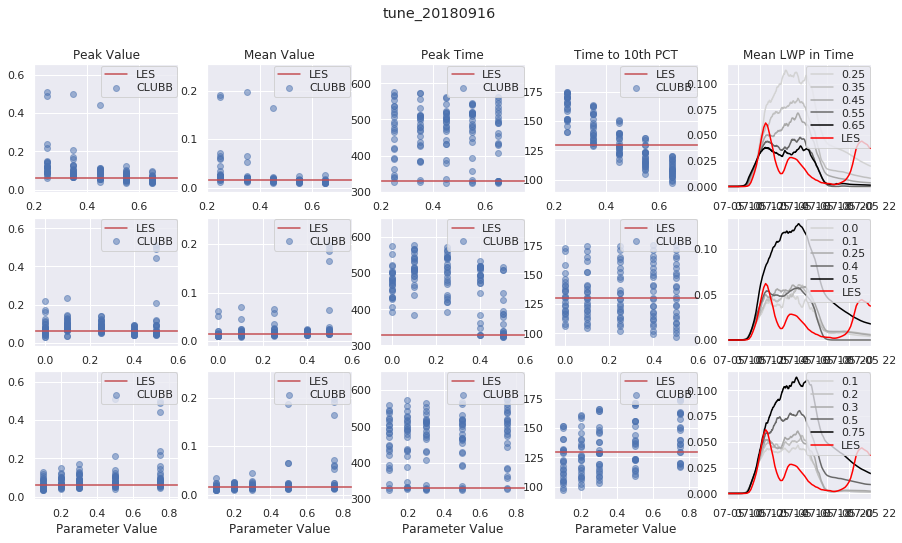

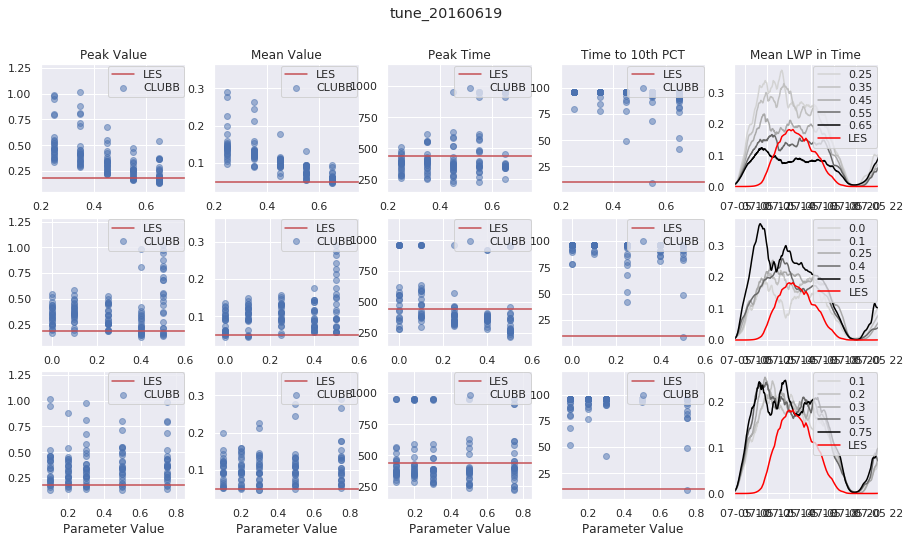

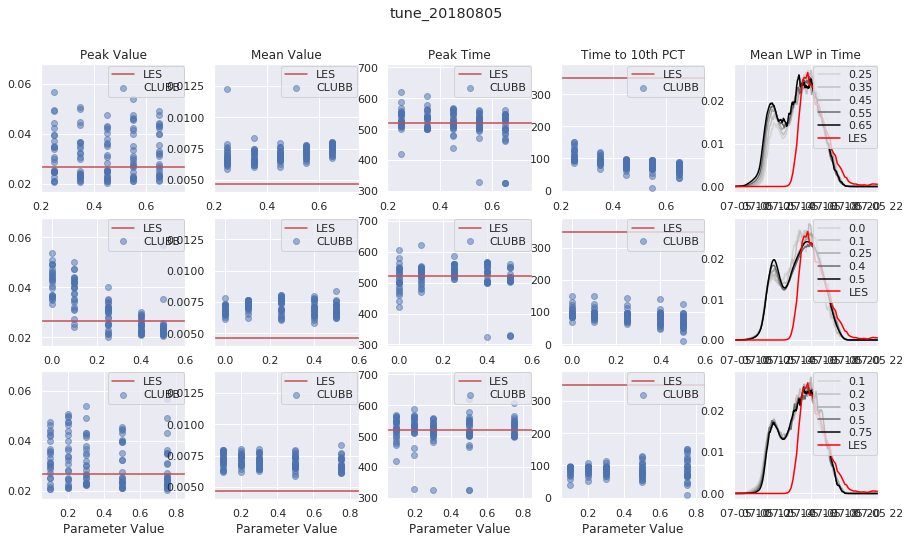

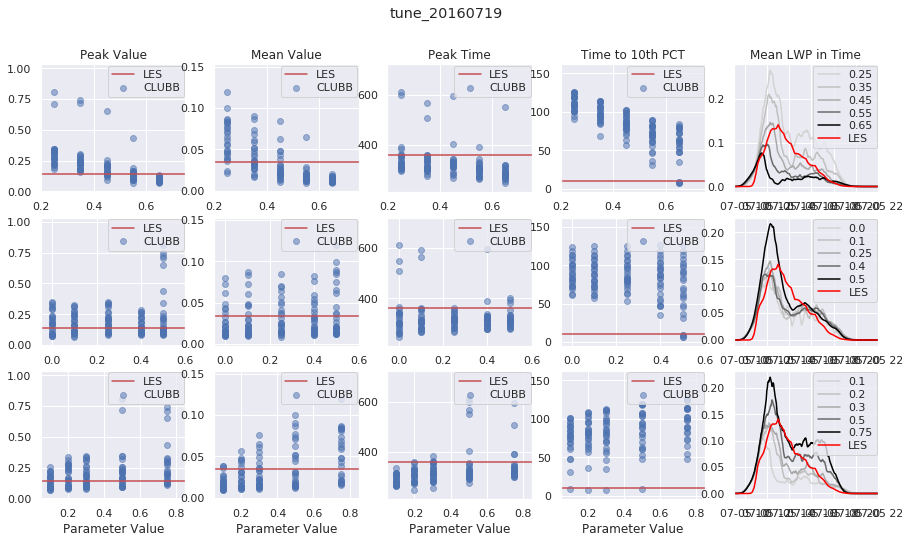

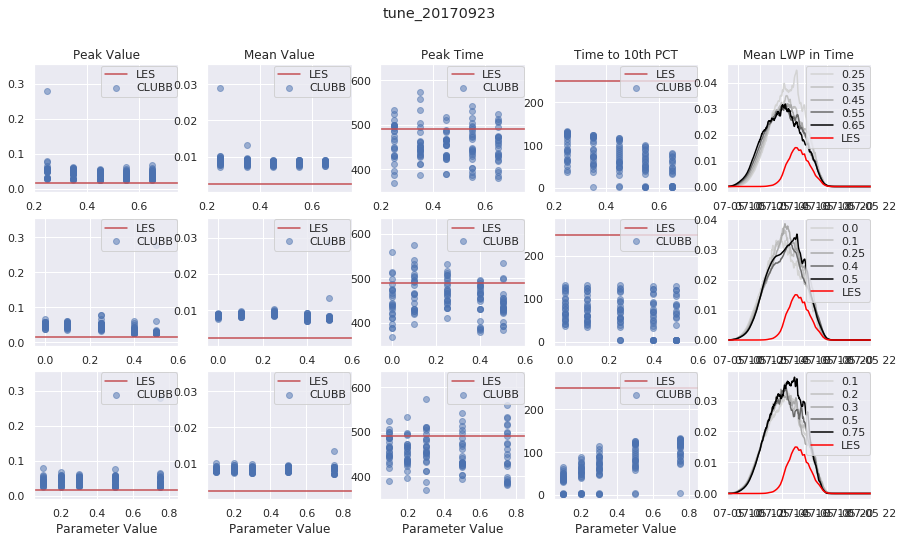

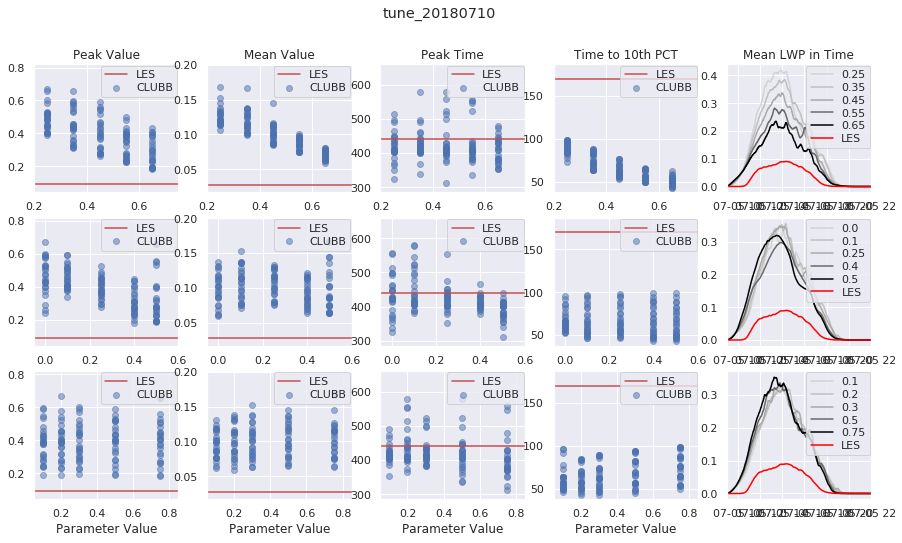

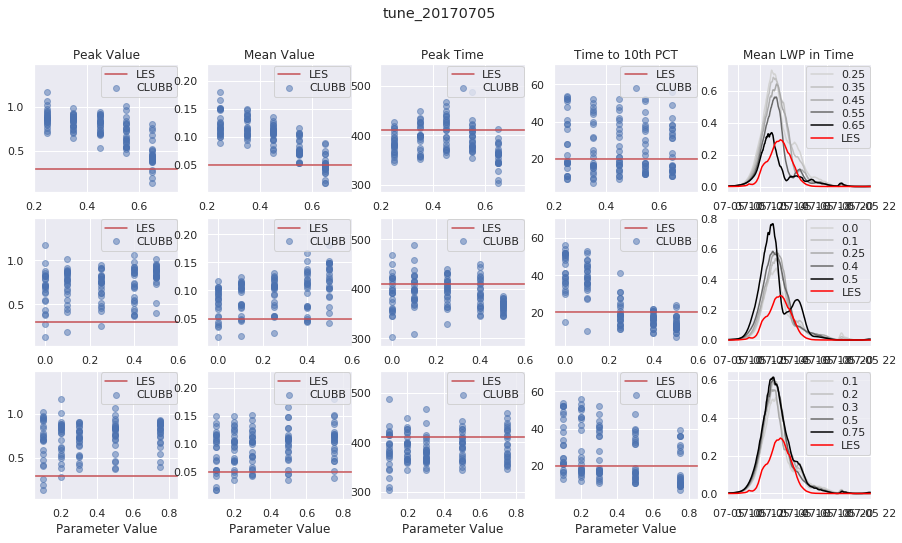

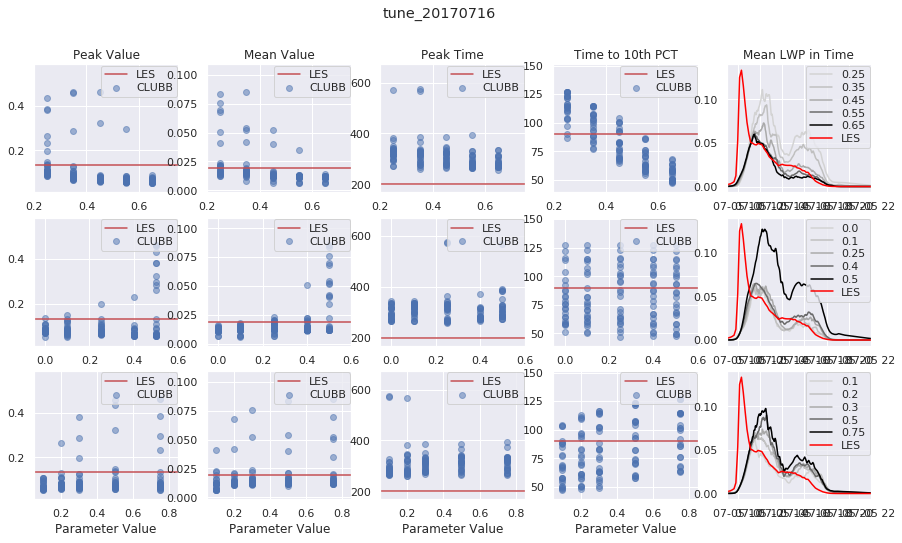

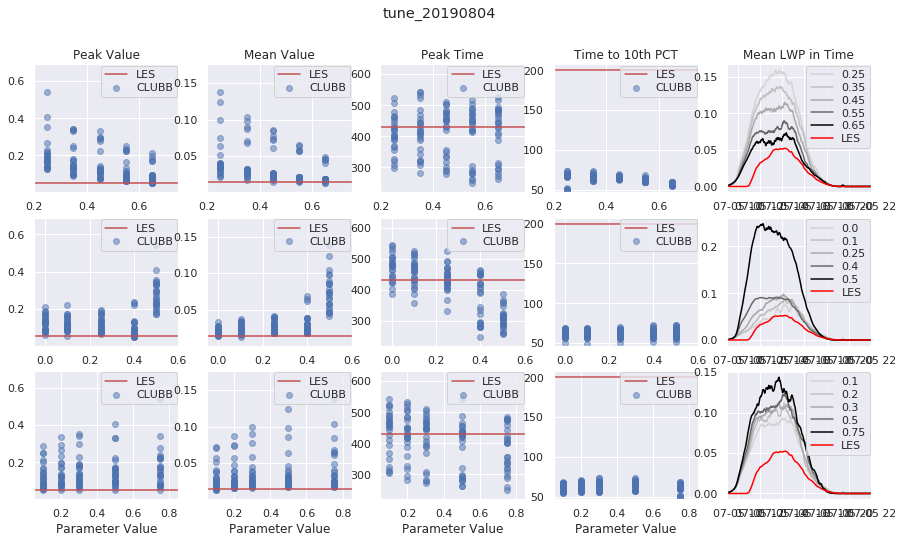

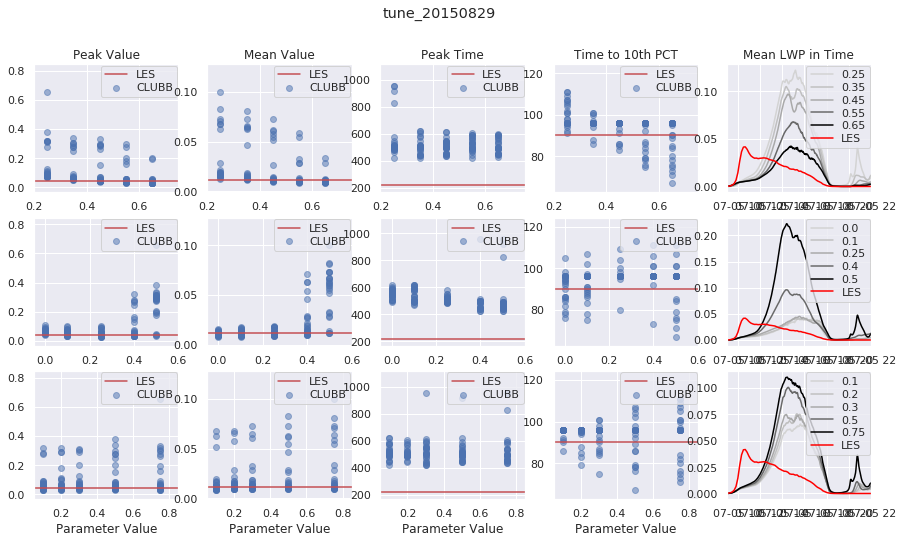

In [540]:
for day in tune_list:
    lwp_hmg =nc.Dataset(les_dir+'trimdoz_'+str(day[5:13])+'_01.nc','r')['lwp'][:]
    LES_pv = np.max(lwp_hmg)
    LES_pt = np.where(lwp_hmg==np.max(lwp_hmg))[0][0]*10
    LES_mv = np.mean(lwp_hmg)
    LES_1t = np.where(lwp_hmg>np.percentile(lwp_hmg,10))[0][0]*10
    plt.figure(figsize=(15,8))
    
    # GAMMA
    plt.subplot(3,5,1)
    plot_test(gamma[day],peak_val[day],LES_pv,'Peak Value')
    plt.ylabel('Gamma')
    plt.subplot(3,5,2)
    plot_test(gamma[day],mean_val[day],LES_mv,'Mean Value')
    plt.subplot(3,5,3)
    plot_test(gamma[day],peak_tim[day],LES_pt,'Peak Time')
    plt.subplot(3,5,4)
    plot_test(gamma[day],pc10_tim[day],LES_1t,'Time to 10th PCT')
    
    plt.subplot(3,5,5)
    colors=['lightgrey','silver','darkgrey','dimgrey','black']
    gs=np.unique(gamma[day])
    gs.sort() 
    leglist=[]
    for idx in range(len(gs)):
        g=gs[idx]
        c=colors[idx]
        m_LWP=np.mean(lwp[day][gamma[day]==g,:],axis=0)
        plt.plot(times_clb1,m_LWP,color=c)
        leglist.append(str(g))
    plt.xlim(times_js[12],times_js[-1])
    plt.plot(times_js,lwp_hmg,color='red')
    leglist.append('LES')
    plt.legend(leglist,loc='upper right',labelspacing=.25,borderaxespad=0.1)
    plt.title('Mean LWP in Time')
    
    # C11
    plt.subplot(3,5,6)
    plot_test(C11[day],peak_val[day],LES_pv,None)
    plt.ylabel('C11')
    plt.subplot(3,5,7)
    plot_test(C11[day],mean_val[day],LES_mv,None)
    plt.subplot(3,5,8)
    plot_test(C11[day],peak_tim[day],LES_pt,None)
    plt.subplot(3,5,9)
    plot_test(C11[day],pc10_tim[day],LES_1t,None)
    plt.subplot(3,5,10)
    gs=np.unique(C11[day])
    gs.sort()
    leglist=[]
    for idx in range(len(gs)):
        g=gs[idx]
        c=colors[idx]
        m_LWP=np.mean(lwp[day][C11[day]==g,:],axis=0)
        plt.plot(times_clb1,m_LWP,color=c)
        leglist.append(str(g))
    plt.xlim(times_js[12],times_js[-1])
    plt.plot(times_js,lwp_hmg,color='red')
    leglist.append('LES')
    plt.legend(leglist,loc='upper right',labelspacing=.25,borderaxespad=0.1)
    
    # C8
    plt.subplot(3,5,11)
    plot_test(C8[day],peak_val[day],LES_pv,None)
    plt.xlabel('Parameter Value')
    plt.ylabel('C8')
    plt.subplot(3,5,12)
    plot_test(C8[day],mean_val[day],LES_mv,None)
    plt.xlabel('Parameter Value')
    plt.subplot(3,5,13)
    plot_test(C8[day],peak_tim[day],LES_pt,None)
    plt.xlabel('Parameter Value')
    plt.subplot(3,5,14)
    plot_test(C8[day],pc10_tim[day],LES_1t,None)
    plt.xlabel('Parameter Value')
    plt.subplot(3,5,15)
    gs=np.unique(C8[day])
    gs.sort() 
    leglist=[]
    for idx in range(len(gs)):
        g=gs[idx]
        c=colors[idx]
        m_LWP=np.mean(lwp[day][C8[day]==g,:],axis=0)
        plt.plot(times_clb1,m_LWP,color=c)
        leglist.append(str(g))
    plt.xlim(times_js[12],times_js[-1])
    plt.plot(times_js,lwp_hmg,color='red')
    leglist.append('LES')
    plt.legend(leglist,loc='upper right',labelspacing=.25,borderaxespad=0.1)
    plt.suptitle(day)
    

In [532]:
print(gamma[day].shape)

(205,)


In [66]:
fname1='g0.65c110.1c80.1'
fname2='g0.25c110.4c80.5'
for day in tune_list:
    plt.figure()
    lwp_hmg =nc.Dataset(les_dir+'trimdoz_'+str(day[5:13])+'_01.nc','r')['lwp'][:]
    fp=nc.Dataset(clubb_dir+day+'/'+fname1+'/k_1/c_1/output/arm_sfc.nc','r')
    fp2=nc.Dataset(clubb_dir+day+'/'+fname2+'/k_1/c_1/output/arm_sfc.nc','r')
    plt.plot(times_js,lwp_hmg,color='red')
    plt.plot(times_clb1,fp['lwp'][:,0,0,0])
    plt.plot(times_clb1,fp2['lwp'][:,0,0,0],'--')
    plt.legend(['LES','tune','default'])

FileNotFoundError: [Errno 2] No such file or directory: b'/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/trimdoz_tune_201_01.nc'

<Figure size 432x288 with 0 Axes>

In [547]:
gs=np.unique(C8[day])
gs.sort()
print(gs)

[0.1  0.2  0.3  0.5  0.75]


In [466]:
np.unique(gamma[day])

array([0.15, 0.25, 0.35, 0.4 ])

In [458]:
np.unique(a)

array([1, 2, 3, 4, 5, 6])

In [444]:
a = 'g0.25c110.5c80.75/'
b=a.replace('c11','g').replace('c8','g').replace('/','').split('g')

In [445]:
b

['', '0.25', '0.5', '0.75']

In [491]:
lwp[day].shape

(100, 4775)

In [520]:
fp=nc.Dataset(clubb_dir+day+'/'+file+'/k_1/c_1/output/arm_zm.nc','r')
fp['wp2'][:].shape

(4775, 301, 1, 1)

In [10]:
##################################################
####### PARAMETER TUNING PART TWO ################
##################################################

In [11]:
tune_list=[]
for file in os.listdir(clubb_dir):
    if 'circ' in file:
        tune_list.append(file)

In [60]:
def plot_test(param,test,LES,name):
    gu=np.unique(param)
    gu.sort()
    test_line=[]
    for g in gu:
        test_line.append(np.mean(test[param==g]))
    plt.scatter(param,test,alpha=.25)
    plt.plot([np.min(gu)-1,np.max(gu)+1],[LES,LES],'r-')
    plt.plot(gu,test_line,'b-')
    xaxh=np.max(gu)-np.min(gu)
    plt.xlim(np.min(gu)-xaxh*.1,np.max(gu)+xaxh*.3)
    yaxh=np.max(test)-np.min(test)
    ymin=min(np.min(test)-.1*yaxh,LES-.1*yaxh)
    ymax=max(np.max(test)+.3*yaxh,LES+.3*yaxh)
    plt.ylim(ymin,ymax)
    plt.legend(['LES','CLUBB'],loc='upper right',labelspacing=.25,borderaxespad=0.1)
    plt.title(name)

In [46]:
##### PULL DATA #####
pvd  = {} #delta peak value
mvd  = {} #delta mean value
ptd  = {} #delta peak time
p1td = {} #delta time to 10% of peak
cr  = {} #c_ratio
ct  = {} #temperature coefficient
cf  = {} #cuttoff value
lwp = {}

runs_=os.listdir(clubb_dir+'circ_tune_20160619')
for day in tune_list:
    print(day)
    pvd[day]=[]
    mvd[day]=[]
    ptd[day]=[]
    p1td[day]=[]
    cr[day]=[]
    ct[day]=[]
    cf[day]=[]
    lwp[day]=[]
    fp1c=nc.Dataset(clubb_dir+'sgp_1c_m/sgp_'+day[10:18]+'/k_1/c_1/output/arm_sfc.nc','r')
    for file in runs_:
        fp=nc.Dataset(clubb_dir+day+'/'+file+'/k_2/agg_outsfc.nc','r')
        lwp[day].append(fp['lwp'][:,0,0,0])
        lwp1c=fp1c['lwp'][:,0,0,0]
        pvd[day].append(np.max(lwp[day][-1])-np.max(lwp1c))
        ptd[day].append(np.where(lwp[day][-1]==np.max(lwp[day][-1]))[0][0]-np.where(lwp1c==np.max(lwp1c))[0][0])
        mvd[day].append(np.mean(lwp[day][-1])-np.mean(lwp1c))
        p1td[day].append(np.where(lwp[day][-1]>np.percentile(lwp[day][-1],10))[0][0]-np.where(lwp1c>np.percentile(lwp1c,10))[0][0])
        ns=file.replace('cr','').replace('ct','x').replace('cf','x').split('x')
        cr[day].append(float(ns[0]))
        ct[day].append(float(ns[1]))
        cf[day].append(float(ns[2]))
    cr[day]=np.array(cr[day])
    ct[day]=np.array(ct[day])
    cf[day]=np.array(cf[day])
    p1td[day]=np.array(p1td[day])
    ptd[day]=np.array(ptd[day])
    mvd[day]=np.array(mvd[day])
    pvd[day]=np.array(pvd[day])
    lwp[day]=np.array(lwp[day])
    

circ_tune_20170705
circ_tune_20170716
circ_tune_20150829
circ_tune_20190804
circ_tune_20180805
circ_tune_20160719
circ_tune_20180916
circ_tune_20160619
circ_tune_20170923
circ_tune_20180710


In [47]:
# Fix LWP days
cr_l={}
ct_l={}
cf_l={}
for day in tune_list:
    cr_l[day]=[]
    ct_l[day]=[]
    cf_l[day]=[]
    new_list=[]
    for i in range(len(lwp[day])):
        if len(lwp[day][i])==955:
            new_list.append(lwp[day][i])
            cr_l[day].append(cr[day][i])
            ct_l[day].append(ct[day][i])
            cf_l[day].append(cf[day][i])
    lwp[day]=np.array(new_list)
    cr_l[day]=np.array(cr_l[day])
    ct_l[day]=np.array(ct_l[day])
    cf_l[day]=np.array(cf_l[day])
print(lwp[day].shape)

(175, 955)


In [40]:
lwp[day][0].shape

(955,)

In [35]:
type((cr[day]==g)[0])

numpy.bool_

/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  from ipykernel import kernelapp as app
/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  from ipykernel import kernelapp as app
/stor/soteria/hydro/private/tsw35/software/miniconda/envs/jenv/lib/python3.7/site-packages/ipykernel_launcher.py:15: UserWarning: Attempting to set identical bottom == top == 0.0 results in singular transformations; automatically expanding.
  from ipykernel import kernelapp as app


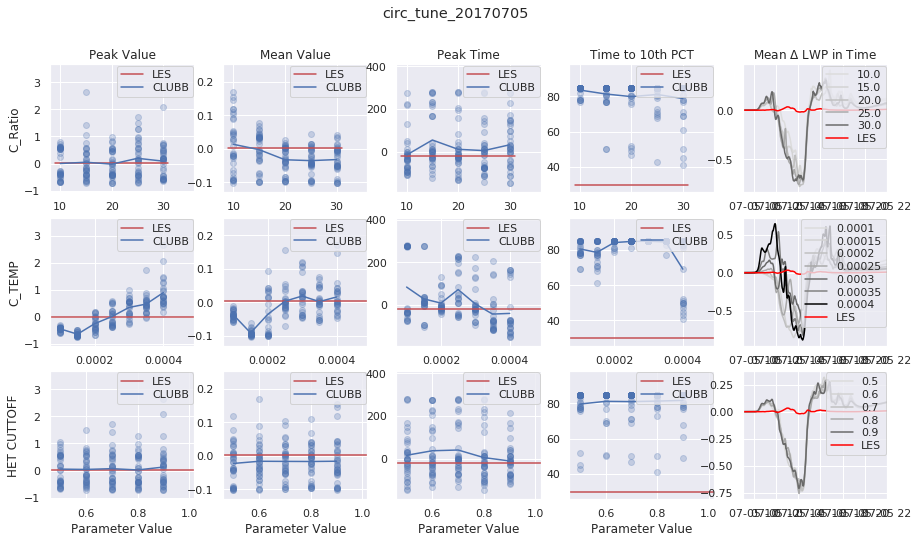

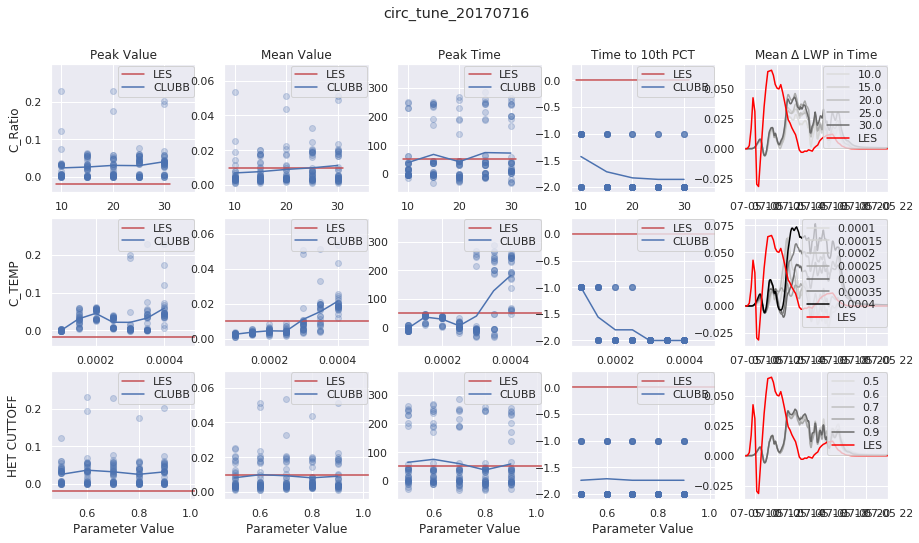

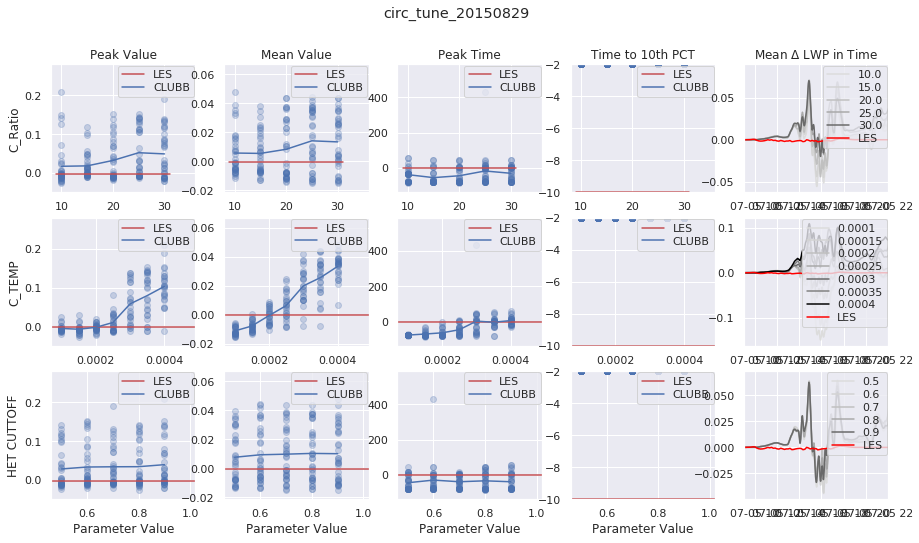

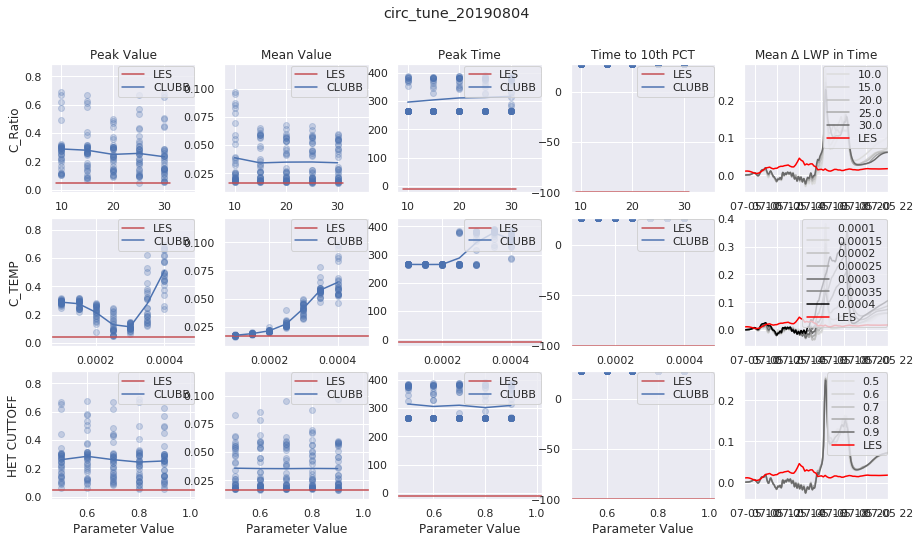

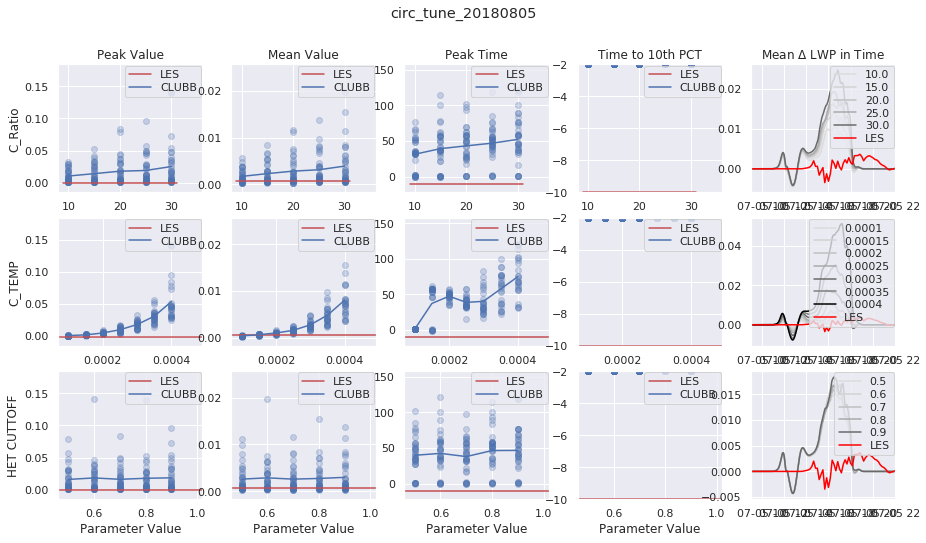

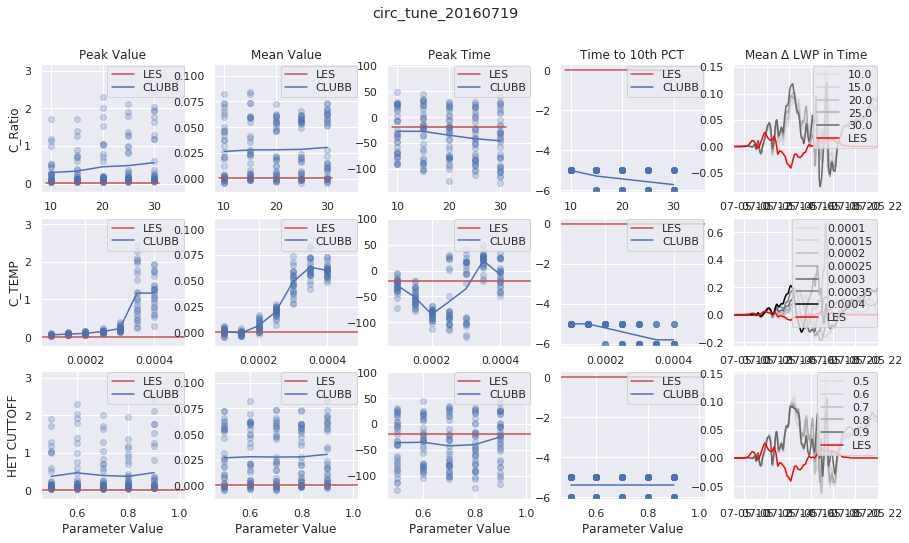

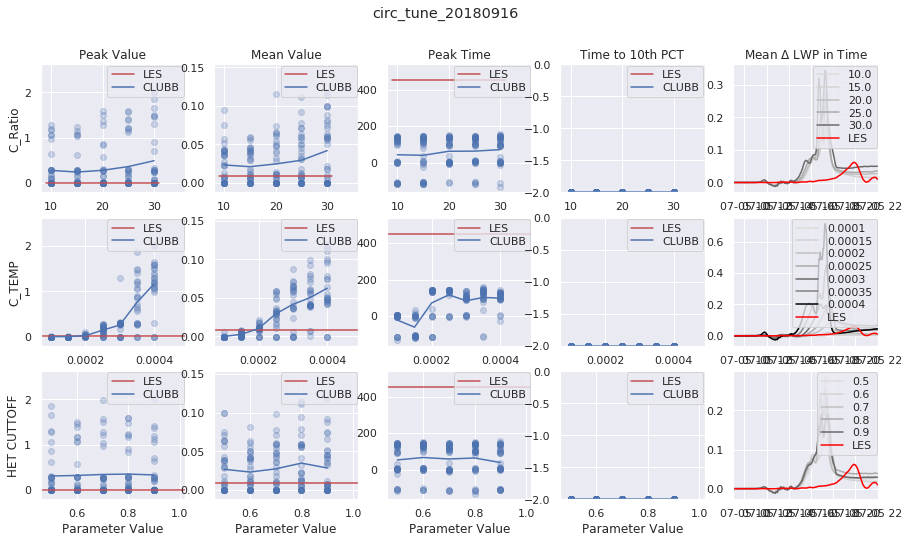

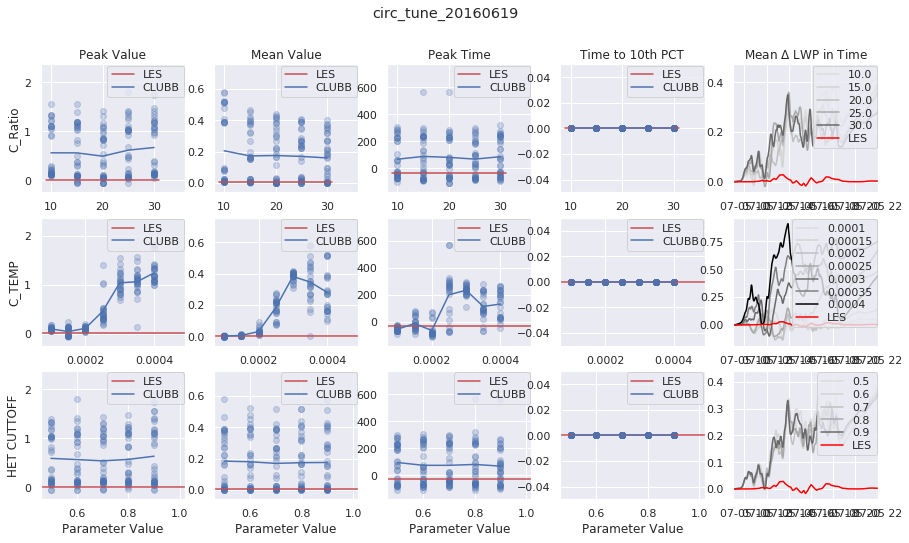

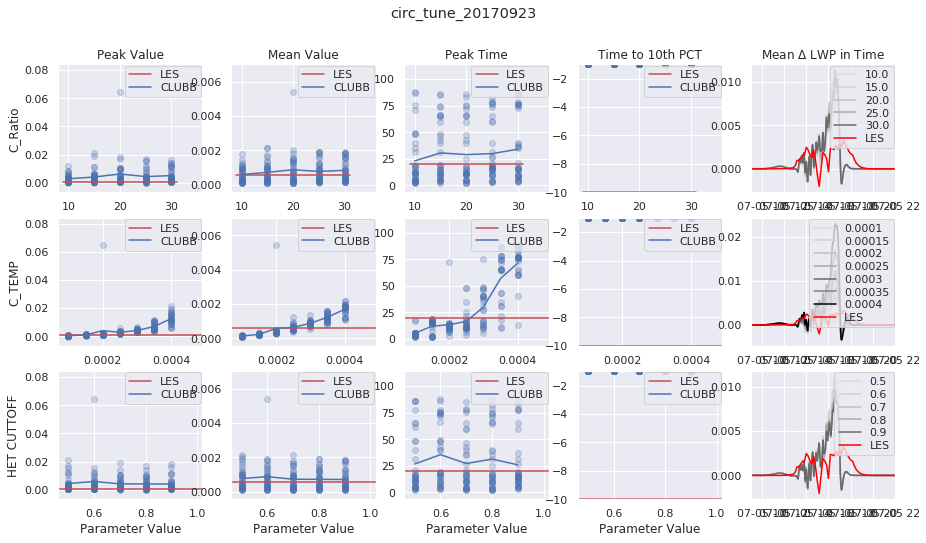

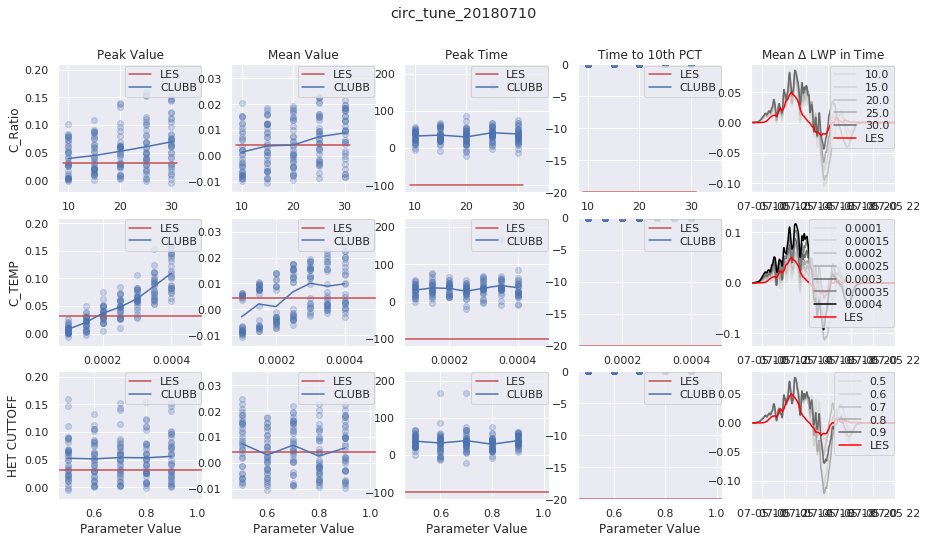

In [63]:
for day in tune_list:
    lwp_hmg =nc.Dataset(les_dir+'trimdoz_'+str(day[10:18])+'_01.nc','r')['lwp'][:]
    lwp_het =nc.Dataset(les_dir+'trimdoz_'+str(day[10:18])+'_00.nc','r')['lwp'][:]
    lwp_1c  =nc.Dataset(clubb_dir+'sgp_1c_m/sgp_'+day[10:18]+'/k_1/c_1/output/arm_sfc.nc','r')['lwp'][:,0,0,0]
    LES_pv = np.max(lwp_het)-np.max(lwp_hmg)
    LES_pt = (np.where(lwp_het==np.max(lwp_het))[0][0]-np.where(lwp_hmg==np.max(lwp_hmg))[0][0])*10
    LES_mv = np.mean(lwp_het)-np.mean(lwp_hmg)
    LES_1t = (np.where(lwp_het>np.percentile(lwp_het,10))[0][0]-np.where(lwp_hmg>np.percentile(lwp_hmg,10))[0][0])*10
    plt.figure(figsize=(15,8))
    
    # C_RATIO
    plt.subplot(3,5,1)
    plot_test(cr[day],pvd[day],LES_pv,'Peak Value')
    plt.ylabel('C_Ratio')
    plt.subplot(3,5,2)
    plot_test(cr[day],mvd[day],LES_mv,'Mean Value')
    plt.subplot(3,5,3)
    plot_test(cr[day],ptd[day],LES_pt,'Peak Time')
    plt.subplot(3,5,4)
    plot_test(cr[day],p1td[day],LES_1t,'Time to 10th PCT')
    
    plt.subplot(3,5,5)
    colors=['gainsboro','lightgrey','silver','darkgrey','dimgrey','grey','black']
    gs=np.unique(cr[day])
    gs.sort()
    leglist=[]
    for idx in range(len(gs)):
        g=gs[idx]
        c=colors[idx]
        m_LWP=np.mean(lwp[day][cr_l[day]==g,:],axis=0)
        plt.plot(times_clb1,m_LWP-lwp_1c,color=c)
        leglist.append(str(g))
    plt.xlim(times_js[12],times_js[-1])
    plt.plot(times_js,lwp_het-lwp_hmg,color='red')
    leglist.append('LES')
    plt.legend(leglist,loc='upper right',labelspacing=.25,borderaxespad=0.1)
    plt.title('Mean $\Delta$ LWP in Time')
    
     # C_X
    plt.subplot(3,5,6)
    plot_test(ct[day],pvd[day],LES_pv,None)
    plt.ylabel('C_TEMP')
    plt.subplot(3,5,7)
    plot_test(ct[day],mvd[day],LES_mv,None)
    plt.subplot(3,5,8)
    plot_test(ct[day],ptd[day],LES_pt,None)
    plt.subplot(3,5,9)
    plot_test(ct[day],p1td[day],LES_1t,None)
    plt.subplot(3,5,10)
    gs=np.unique(ct[day])
    gs.sort()
    leglist=[]
    for idx in range(len(gs)):
        g=gs[idx]
        c=colors[idx]
        m_LWP=np.mean(lwp[day][ct_l[day]==g,:],axis=0)
        plt.plot(times_clb1,m_LWP-lwp_1c,color=c)
        leglist.append(str(g))
    plt.xlim(times_js[12],times_js[-1])
    plt.plot(times_js,lwp_het-lwp_hmg,color='red')
    leglist.append('LES')
    plt.legend(leglist,loc='upper right',labelspacing=.25,borderaxespad=0.1)
    
    # L CUTOFF
    plt.subplot(3,5,11)
    plot_test(cf[day],pvd[day],LES_pv,None)
    plt.xlabel('Parameter Value')
    plt.ylabel('HET CUTTOFF')
    plt.subplot(3,5,12)
    plot_test(cf[day],mvd[day],LES_mv,None)
    plt.xlabel('Parameter Value')
    plt.subplot(3,5,13)
    plot_test(cf[day],ptd[day],LES_pt,None)
    plt.xlabel('Parameter Value')
    plt.subplot(3,5,14)
    plot_test(cf[day],p1td[day],LES_1t,None)
    plt.xlabel('Parameter Value')
    plt.subplot(3,5,15)
    gs=np.unique(cf[day])
    gs.sort() 
    leglist=[]
    for idx in range(len(gs)):
        g=gs[idx]
        c=colors[idx]
        m_LWP=np.mean(lwp[day][cf_l[day]==g,:],axis=0)
        plt.plot(times_clb1,m_LWP-lwp_1c,color=c)
        leglist.append(str(g))
    plt.xlim(times_js[12],times_js[-1])
    plt.plot(times_js,lwp_het-lwp_hmg,color='red')
    leglist.append('LES')
    plt.legend(leglist,loc='upper right',labelspacing=.25,borderaxespad=0.1)
    
    plt.suptitle(day)

In [ ]:
##################################################
####### COMPARE SPONGE DAMPING AD ################
##################################################

sgp_20170527
x and y must have same first dimension, but have shapes (955,) and (590,)

sgp_20180514
x and y must have same first dimension, but have shapes (955,) and (815,)

sgp_20170614
x and y must have same first dimension, but have shapes (955,) and (750,)



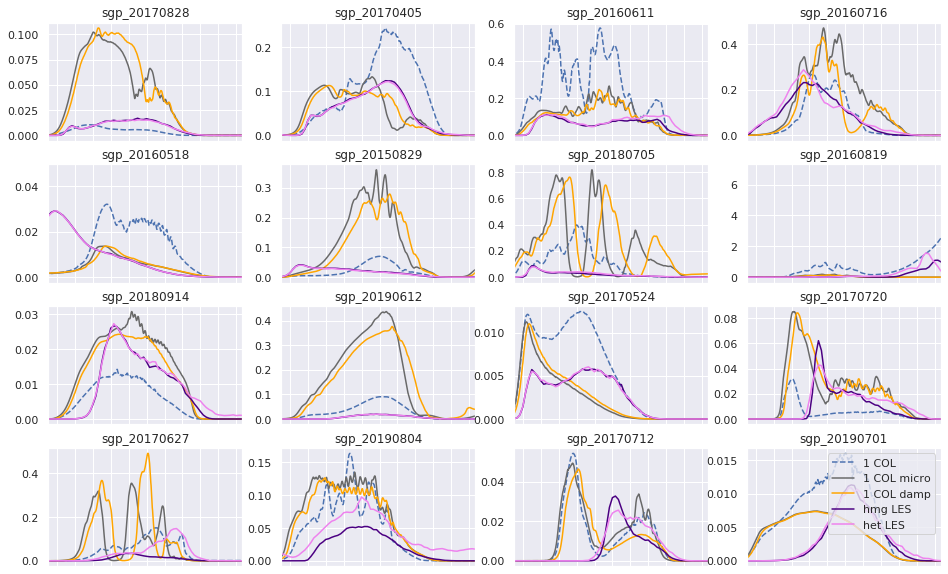

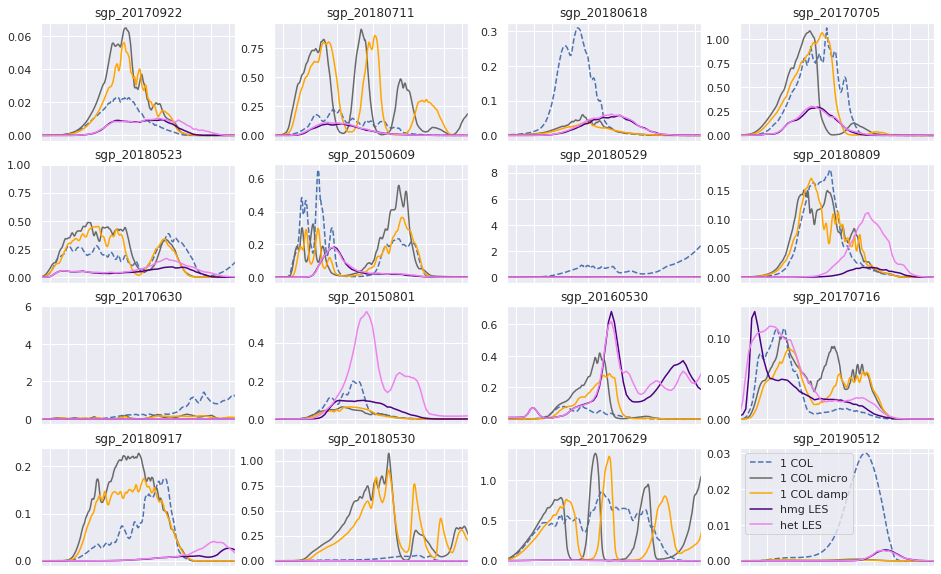

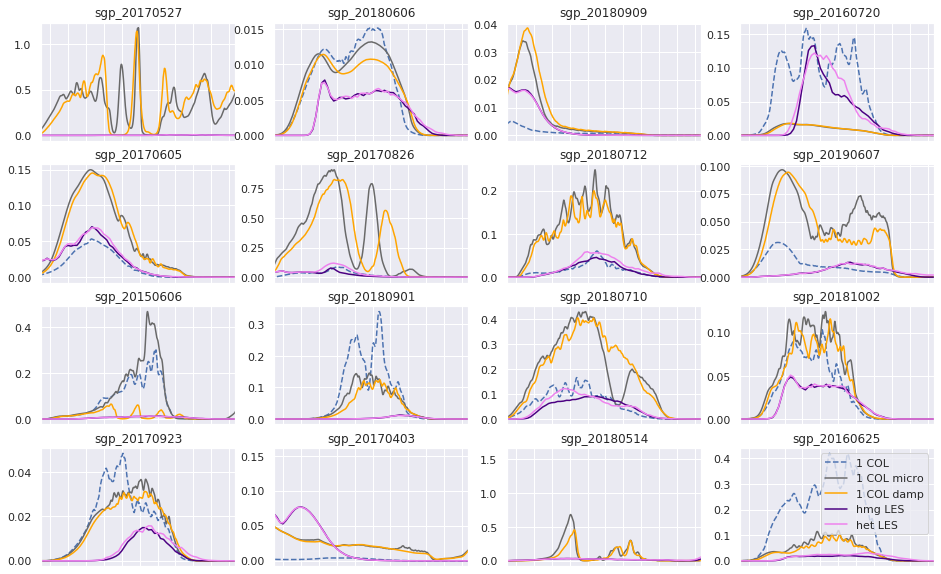

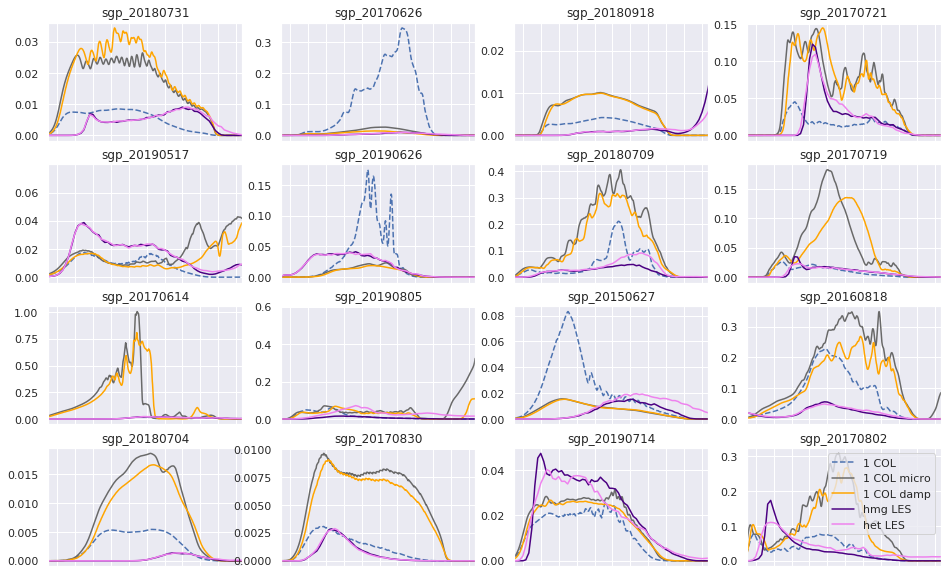

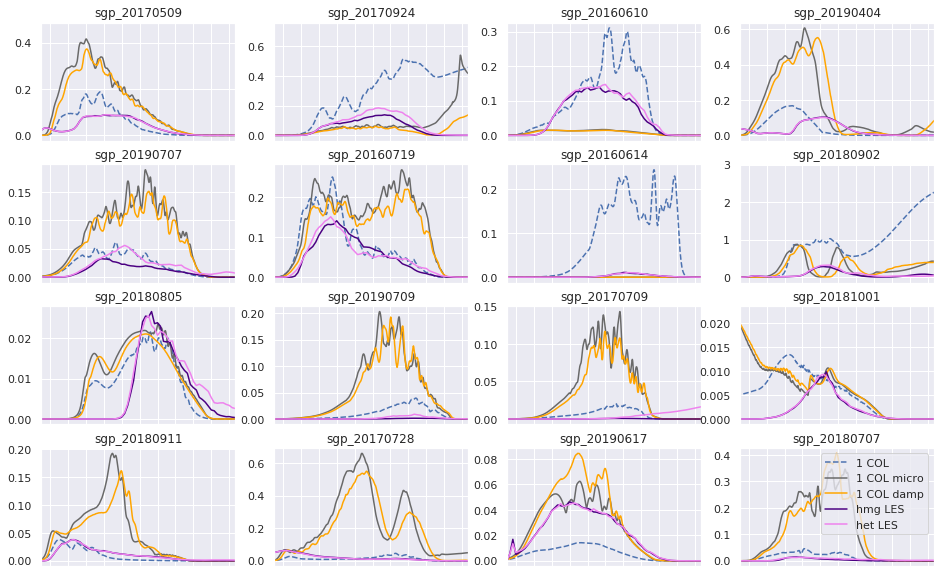

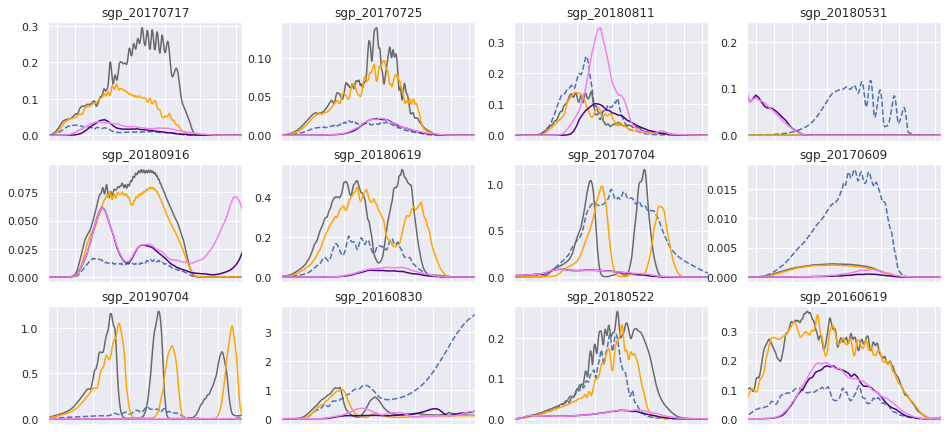

In [523]:
# COMPARE ALL LWP
frst = True
fdir = clubb_dir+'sgp_1c'
les_dir= '/stor/soteria/hydro/shared/data/tylersclutter/doz_tylertrim/'
day_list2=os.listdir(fdir)
plt.figure(figsize=(16,10))
i=1

fp=nc.Dataset(les_dir+'trimdoz_20170705_01.nc','r')
dt1 = datetime.datetime(2016,1,1,0,0)
times_js = []
for t in range(len(fp['time'][:])):
    times_js.append(dt1+datetime.timedelta(minutes=int(fp['time'][t]))-datetime.timedelta(hours=5))
    
dt1 = times_js[0]
dt1 = dt1-datetime.timedelta(hours=dt1.hour)+datetime.timedelta(hours=7)
fp=nc.Dataset(clubb_dir+'sgp_1c/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb1 = []
for t in range(len(fp['time'][:])):
    times_clb1.append(dt1+datetime.timedelta(seconds=int(t*60)))

fp=nc.Dataset(clubb_dir+'sgp_1c_dt1/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb2 = []
for t in range(len(fp['time'][:])):
    times_clb2.append(dt1+datetime.timedelta(seconds=int(t)))
    
fp=nc.Dataset(clubb_dir+'sgp_1c_dt6/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb6 = []
for t in range(len(fp['time'][:])):
    times_clb6.append(dt1+datetime.timedelta(seconds=int(t*6)))
    
fp=nc.Dataset(clubb_dir+'sgp_1c_dt12/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb12 = []
for t in range(len(fp['time'][:])):
    times_clb12.append(dt1+datetime.timedelta(seconds=int(t*12)))
    
fp=nc.Dataset(clubb_dir+'sgp_1c_dt30/sgp_20180618/k_1/c_1/output/arm_sfc.nc','r')
times_clb30 = []
for t in range(len(fp['time'][:])):
    times_clb30.append(dt1+datetime.timedelta(seconds=int(t*30)))


for day in day_list2:
    if i==17:
        i=1
        plt.figure(figsize=(16,10))
    plt.subplot(4,4,i)
    i = i+1
    fp1c=nc.Dataset(clubb_dir+'sgp_1c/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp1cm=nc.Dataset(clubb_dir+'sgp_1c_mphy/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp1cm2=nc.Dataset(clubb_dir+'sgp_1c_m/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    fp1cm12=nc.Dataset(clubb_dir+'sgp_1c_dt12/'+day+'/k_1/c_1/output/arm_sfc.nc','r')
    
    try:
        plt.plot(times_clb1,fp1c['lwp'][:,0,0,0],'b--')
    except Exception as e:
        print(day)
        print(e)
        print()
    try:
        plt.plot(times_clb12,fp1cm12['lwp'][:,0,0,0],'-',color='dimgrey')
    except Exception as e:
        print(day)
        print(e)
        print()
    try:
        plt.plot(times_clb1,fp1cm2['lwp'][:,0,0,0],'-',color='orange')
    except Exception as e:
        print(day)
        print(e)
        print()

    frame1 = plt.gca()
    frame1.axes.xaxis.set_ticklabels([])
    
    plt.title(day)
    
    #homoLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_01.nc','r')
    plt.plot(times_js,fp['lwp'][:],'-',color='indigo')
    fp.close()
    
    #hetLES
    fp=nc.Dataset(les_dir+'trimdoz_'+str(day[4:12])+'_00.nc','r')
    plt.plot(times_js,fp['lwp'][:],'-',color='violet')
    fp.close()
    
    leglist=dirlist.copy()
    leglist.append('HMG LES')
    leglist.append('HET LES')
    plt.xlim(times_js[15],times_js[80])
    if i == 17:

        plt.legend(['1 COL','1 COL micro','1 COL damp','hmg LES','het LES'])
        #plt.legend(['1 COL','|| no wind','|| wind','no wind','wind','hmg LES','het LES'])